In [32]:
import json
import os
import torch
import pandas as pd
import os
from ultralytics import YOLO
from tqdm import tqdm
import matplotlib.pyplot as plt
import random
import cv2
from models.experimental import attempt_load
from utils.general import non_max_suppression
import tensorflow as tf

In [37]:
print("CUDA Available:", torch.cuda.is_available())
print("GPU Count:", torch.cuda.device_count())
print("GPU Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU detected")

CUDA Available: False
GPU Count: 0
GPU Name: No GPU detected


In [34]:
print("GPU Available:", tf.config.list_physical_devices('GPU'))

GPU Available: []


In [35]:
!nvidia-smi

Tue Mar 25 16:54:59 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 561.19                 Driver Version: 561.19         CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3050 ...  WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   56C    P3             13W /   30W |       0MiB /   4096MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [36]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu126

Looking in indexes: https://download.pytorch.org/whl/cu126
INFO: pip is looking at multiple versions of torchaudio to determine which version is compatible with other requirements. This could take a while.
     ---------------------------------------- 0.0/6.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/6.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/6.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/6.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/6.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/6.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/6.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/6.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/6.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/6.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/6.2 MB ? eta -:--:--
     --------

ERROR: Exception:
Traceback (most recent call last):
  File "C:\Users\svani\anaconda3\envs\tensorflow\lib\site-packages\pip\_vendor\urllib3\response.py", line 438, in _error_catcher
    yield
  File "C:\Users\svani\anaconda3\envs\tensorflow\lib\site-packages\pip\_vendor\urllib3\response.py", line 561, in read
    data = self._fp_read(amt) if not fp_closed else b""
  File "C:\Users\svani\anaconda3\envs\tensorflow\lib\site-packages\pip\_vendor\urllib3\response.py", line 527, in _fp_read
    return self._fp.read(amt) if amt is not None else self._fp.read()
  File "C:\Users\svani\anaconda3\envs\tensorflow\lib\site-packages\pip\_vendor\cachecontrol\filewrapper.py", line 98, in read
    data: bytes = self.__fp.read(amt)
  File "C:\Users\svani\anaconda3\envs\tensorflow\lib\http\client.py", line 466, in read
    s = self.fp.read(amt)
  File "C:\Users\svani\anaconda3\envs\tensorflow\lib\socket.py", line 705, in readinto
    return self._sock.recv_into(b)
  File "C:\Users\svani\anaconda3\envs\te

In [38]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
model.to(device)

Using device: cpu


Model(
  (model): Sequential(
    (0): ReOrg()
    (1): Conv(
      (conv): Conv2d(12, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (act): SiLU(inplace=True)
    )
    (2): Conv(
      (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (act): SiLU(inplace=True)
    )
    (3): Conv(
      (conv): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1))
      (act): SiLU(inplace=True)
    )
    (4): Conv(
      (conv): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1))
      (act): SiLU(inplace=True)
    )
    (5): Conv(
      (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (act): SiLU(inplace=True)
    )
    (6): Conv(
      (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (act): SiLU(inplace=True)
    )
    (7): Conv(
      (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (act): SiLU(inplace=True)
    )
    (8): Conv(
      (conv): Conv2d(64, 64, kernel_

In [2]:
coco_data = {
    "images": [],
    "annotations": [],
    "categories": [
        {
            "id": 1,
            "name": "person",
            "supercategory": "person",
            "keypoints": [
                "head", "shoulders", "elbows", "hands", 
                "hip", "knees", "feet", "bat_tip", "bat_middle"
            ],
            "skeleton": [
                [1, 2], [2, 3], [3, 4], [5, 6], [6, 7], [7, 8], [8, 9]
            ]
        }
    ]
}


In [14]:
image_folder = "C:/Users/svani/OneDrive/Desktop/Cricket/train/"
classes = ['drive', 'legglance-flick', 'pullshot', 'sweep']

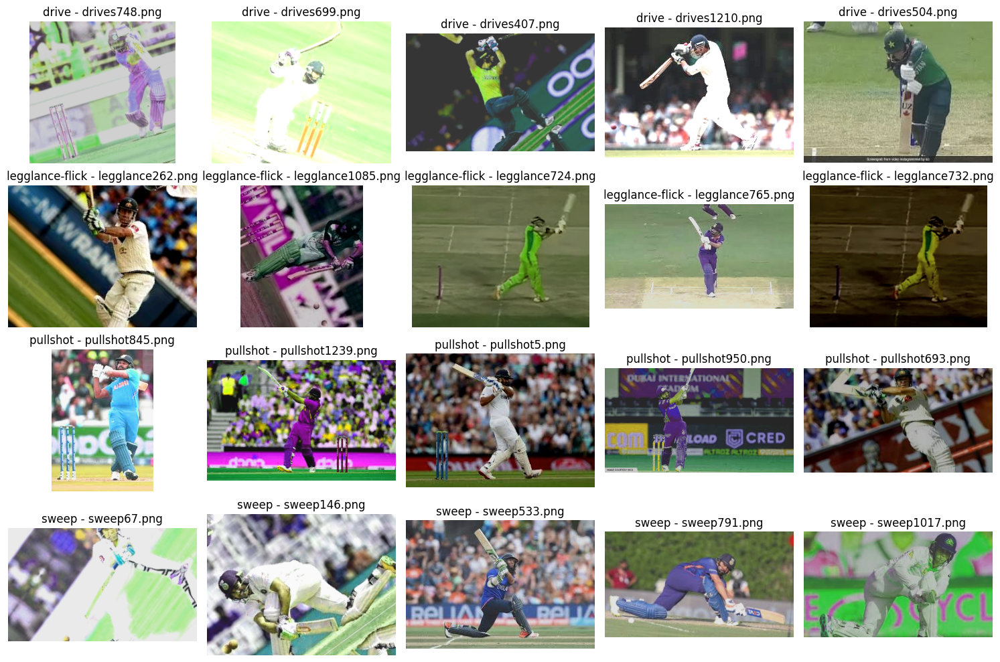

In [15]:
def plot_images_from_classes(image_folder, classes, num_images=5):
    fig, axes = plt.subplots(len(classes), num_images, figsize=(15, 10))

    for i, class_name in enumerate(classes):
        class_path = os.path.join(image_folder, class_name)
        
        if not os.path.isdir(class_path):
            print(f"Class {class_name} directory does not exist.")
            continue
        
        images = [img for img in os.listdir(class_path) if img.endswith(('.jpg', '.png'))]
        
        selected_images = random.sample(images, num_images)
        
        for j, image_name in enumerate(selected_images):
            image_path = os.path.join(class_path, image_name)
            img = cv2.imread(image_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
            axes[i, j].imshow(img)
            axes[i, j].axis('off')  # Hide axis
            axes[i, j].set_title(f"{class_name} - {image_name}")

    plt.tight_layout()
    plt.show()

plot_images_from_classes(image_folder, classes, num_images=5)


In [ ]:
# YOLO 8S POSE

In [44]:
def extract_keypoints_from_images(image_folder, poseweights='yolov8s-pose.pt', device='cpu'):
    model = YOLO(poseweights)
    keypoints_data = []

    for class_name in os.listdir(image_folder):
        class_path = os.path.join(image_folder, class_name)
        for image_name in os.listdir(class_path):
            image_path = os.path.join(class_path, image_name)
            
            results = model(image_path, device=device, save=False, conf=0.5)
            
            for result in results:
                output_data = result.keypoints  
                
                if output_data is None or len(output_data) == 0:
                    print(f"No detections for {image_name}")
                    continue
                
                for keypoints_obj in output_data:
                    keypoints_list = keypoints_obj.data.cpu().numpy().tolist()
                    keypoints_data.append({
                        'Image': image_name,
                        'Class': class_name,
                        'Keypoints': keypoints_list
                    })
    
    return pd.DataFrame(keypoints_data)


image_folder = "C:/Users/svani/OneDrive/Desktop/Cricket/train/"

keypoints = extract_keypoints_from_images(image_folder)

keypoints.to_csv("cricket_keypoints.csv", index=False)



image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1.png: 480x640 2 persons, 125.0ms
Speed: 3.0ms preprocess, 125.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives10.png: 640x512 1 person, 138.2ms
Speed: 2.0ms preprocess, 138.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives100.png: 416x640 1 person, 114.0ms
Speed: 2.0ms preprocess, 114.0ms inference, 0.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1000.png: 640x480 1 person, 143.0ms
Speed: 1.0ms preprocess, 143.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1001.png: 640x480 1 person, 144.0ms
Speed: 2.0ms preprocess, 144.0ms inference, 0.0ms postprocess per image at shape (1, 3, 

Speed: 2.0ms preprocess, 123.4ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1035.png: 416x640 1 person, 130.7ms
Speed: 2.0ms preprocess, 130.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1036.png: 416x640 1 person, 142.4ms
Speed: 2.0ms preprocess, 142.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1037.png: 416x640 1 person, 122.6ms
Speed: 2.0ms preprocess, 122.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1038.jpeg: 416x640 1 person, 153.5ms
Speed: 2.5ms preprocess, 153.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1039.png: 416x640 1 


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1071.png: 480x640 1 person, 151.0ms
Speed: 2.0ms preprocess, 151.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1072.png: 480x640 2 persons, 156.0ms
Speed: 2.0ms preprocess, 156.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1073.png: 480x640 1 person, 158.0ms
Speed: 2.0ms preprocess, 158.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1074.jpeg: 480x640 1 person, 155.0ms
Speed: 2.0ms preprocess, 155.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1075.png: 640x608 1 person, 232.0ms
Speed: 3.0ms preprocess, 232.0ms inference, 1.0ms postprocess per image at shape 

Speed: 1.0ms preprocess, 133.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 416)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1108.png: 640x416 1 person, 143.0ms
Speed: 2.0ms preprocess, 143.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 416)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1109.png: 640x416 1 person, 150.0ms
Speed: 2.0ms preprocess, 150.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 416)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives111.png: 640x608 1 person, 183.0ms
Speed: 4.0ms preprocess, 183.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 608)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1110.jpeg: 640x416 1 person, 118.0ms
Speed: 2.0ms preprocess, 118.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 416)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1111.png: 640x640 1 p


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1144.png: 448x640 1 person, 147.4ms
Speed: 1.0ms preprocess, 147.4ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1145.png: 448x640 1 person, 155.1ms
Speed: 1.0ms preprocess, 155.1ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1146.jpeg: 448x640 1 person, 171.0ms
Speed: 3.0ms preprocess, 171.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1147.png: 640x640 2 persons, 219.4ms
Speed: 4.0ms preprocess, 219.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1148.png: 640x640 1 person, 186.0ms
Speed: 4.0ms preprocess, 186.0ms inference, 1.0ms postprocess per image at shape 

Speed: 2.0ms preprocess, 128.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1181.png: 448x640 1 person, 126.0ms
Speed: 1.0ms preprocess, 126.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1182.jpeg: 448x640 3 persons, 118.0ms
Speed: 2.0ms preprocess, 118.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1183.png: 416x640 4 persons, 109.0ms
Speed: 1.0ms preprocess, 109.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1184.png: 416x640 (no detections), 114.0ms
Speed: 2.0ms preprocess, 114.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1185.png: 4


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1217.png: 352x640 7 persons, 102.0ms
Speed: 1.0ms preprocess, 102.0ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1218.webp: 352x640 5 persons, 100.6ms
Speed: 2.0ms preprocess, 100.6ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1219.png: 384x640 1 person, 115.0ms
Speed: 2.0ms preprocess, 115.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives122.png: 640x608 1 person, 161.0ms
Speed: 4.0ms preprocess, 161.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 608)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives1220.png: 384x640 1 person, 105.0ms
Speed: 1.0ms preprocess, 105.0ms inference, 0.0ms postprocess per image at shape 

Speed: 2.0ms preprocess, 122.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives152.png: 384x640 1 person, 123.0ms
Speed: 2.0ms preprocess, 123.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives153.png: 384x640 1 person, 116.1ms
Speed: 1.0ms preprocess, 116.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives154.png: 384x640 1 person, 115.0ms
Speed: 2.0ms preprocess, 115.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives155.png: 384x640 1 person, 114.7ms
Speed: 2.0ms preprocess, 114.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives156.png: 384x640 1 person

Speed: 2.0ms preprocess, 170.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives19.png: 640x608 1 person, 177.0ms
Speed: 3.0ms preprocess, 177.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 608)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives190.png: 512x640 1 person, 149.8ms
Speed: 2.0ms preprocess, 149.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives191.png: 512x640 1 person, 146.0ms
Speed: 2.0ms preprocess, 146.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives192.png: 512x640 1 person, 155.0ms
Speed: 2.0ms preprocess, 155.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives193.png: 512x640 1 person,

Speed: 1.0ms preprocess, 142.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives226.png: 416x640 1 person, 134.5ms
Speed: 2.0ms preprocess, 134.5ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives227.png: 416x640 1 person, 134.6ms
Speed: 2.0ms preprocess, 134.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives228.png: 416x640 1 person, 126.0ms
Speed: 2.0ms preprocess, 126.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives229.png: 416x640 1 person, 125.0ms
Speed: 1.0ms preprocess, 125.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives23.png: 640x608 1 person,


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives262.png: 448x640 1 person, 121.0ms
Speed: 2.0ms preprocess, 121.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives263.png: 448x640 1 person, 119.0ms
Speed: 2.0ms preprocess, 119.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives264.png: 448x640 1 person, 113.6ms
Speed: 2.0ms preprocess, 113.6ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives265.png: 448x640 1 person, 121.0ms
Speed: 2.0ms preprocess, 121.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives266.png: 448x640 1 person, 112.0ms
Speed: 1.0ms preprocess, 112.0ms inference, 1.0ms postprocess per image at shape (1, 3, 

Speed: 2.0ms preprocess, 123.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives3.png: 480x640 1 person, 121.7ms
Speed: 1.0ms preprocess, 121.7ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives30.jpeg: 480x640 3 persons, 127.0ms
Speed: 2.0ms preprocess, 127.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives300.png: 640x480 1 person, 119.0ms
Speed: 2.0ms preprocess, 119.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives301.png: 640x480 1 person, 126.0ms
Speed: 1.0ms preprocess, 126.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives302.png: 640x480 1 person,


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives335.png: 480x640 2 persons, 149.0ms
Speed: 2.0ms preprocess, 149.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives336.png: 480x640 3 persons, 137.0ms
Speed: 1.0ms preprocess, 137.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives337.png: 480x640 2 persons, 138.0ms
Speed: 2.0ms preprocess, 138.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives338.png: 480x640 2 persons, 152.0ms
Speed: 2.0ms preprocess, 152.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives339.png: 480x640 3 persons, 151.0ms
Speed: 2.0ms preprocess, 151.0ms inference, 1.0ms postprocess per image at shape (1

Speed: 1.0ms preprocess, 125.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives372.png: 416x640 1 person, 131.0ms
Speed: 2.0ms preprocess, 131.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives373.png: 416x640 1 person, 131.0ms
Speed: 1.0ms preprocess, 131.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives374.png: 416x640 1 person, 116.0ms
Speed: 1.0ms preprocess, 116.0ms inference, 0.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives375.png: 416x640 1 person, 119.0ms
Speed: 1.0ms preprocess, 119.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives376.png: 416x640 1 person


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives408.png: 416x640 1 person, 118.0ms
Speed: 1.0ms preprocess, 118.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives409.png: 416x640 1 person, 106.0ms
Speed: 1.0ms preprocess, 106.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives41.png: 640x576 1 person, 139.8ms
Speed: 3.0ms preprocess, 139.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives410.png: 416x640 (no detections), 120.0ms
Speed: 1.0ms preprocess, 120.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives411.png: 416x640 (no detections), 110.5ms
Speed: 1.0ms preprocess, 110.5ms inference, 0.0ms postprocess per image at 

Speed: 1.0ms preprocess, 114.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives445.png: 416x640 2 persons, 104.0ms
Speed: 1.0ms preprocess, 104.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives446.png: 416x640 4 persons, 110.0ms
Speed: 2.0ms preprocess, 110.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives447.png: 416x640 (no detections), 113.0ms
Speed: 1.0ms preprocess, 113.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives448.png: 416x640 2 persons, 107.2ms
Speed: 1.0ms preprocess, 107.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives449.png: 416x64


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives481.png: 640x640 1 person, 194.0ms
Speed: 4.0ms preprocess, 194.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives482.png: 640x640 1 person, 180.0ms
Speed: 3.0ms preprocess, 180.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives483.png: 640x640 1 person, 194.0ms
Speed: 4.0ms preprocess, 194.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives484.png: 640x640 1 person, 195.0ms
Speed: 4.0ms preprocess, 195.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives485.png: 640x640 1 person, 188.0ms
Speed: 4.0ms preprocess, 188.0ms inference, 1.0ms postprocess per image at shape (1, 3, 

Speed: 2.0ms preprocess, 130.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives518.png: 480x640 1 person, 129.9ms
Speed: 2.0ms preprocess, 129.9ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives519.png: 480x640 1 person, 132.0ms
Speed: 1.0ms preprocess, 132.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives52.png: 416x640 2 persons, 129.0ms
Speed: 1.0ms preprocess, 129.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives520.png: 480x640 1 person, 143.0ms
Speed: 2.0ms preprocess, 143.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives521.png: 480x640 1 person


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives554.png: 640x544 1 person, 141.0ms
Speed: 3.0ms preprocess, 141.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives555.png: 640x544 1 person, 137.0ms
Speed: 3.0ms preprocess, 137.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives556.png: 640x544 1 person, 136.0ms
Speed: 3.0ms preprocess, 136.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives557.png: 640x544 (no detections), 139.5ms
Speed: 3.0ms preprocess, 139.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives558.png: 640x544 1 person, 136.0ms
Speed: 2.0ms preprocess, 136.0ms inference, 1.0ms postprocess per image at shape 

Speed: 2.0ms preprocess, 114.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives591.png: 384x640 1 person, 111.2ms
Speed: 1.0ms preprocess, 111.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives592.png: 384x640 1 person, 125.0ms
Speed: 2.0ms preprocess, 125.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives593.png: 384x640 1 person, 112.2ms
Speed: 2.0ms preprocess, 112.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives594.png: 384x640 1 person, 120.5ms
Speed: 2.0ms preprocess, 120.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives595.png: 416x640 (no dete


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives627.png: 640x416 (no detections), 139.9ms
Speed: 2.0ms preprocess, 139.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 416)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives628.png: 640x416 1 person, 129.0ms
Speed: 2.0ms preprocess, 129.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 416)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives629.png: 640x416 1 person, 133.6ms
Speed: 2.0ms preprocess, 133.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 416)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives63.png: 480x640 5 persons, 160.5ms
Speed: 2.0ms preprocess, 160.5ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives630.png: 640x416 1 person, 129.0ms
Speed: 2.0ms preprocess, 129.0ms inference, 1.0ms postprocess per image at shape 

Speed: 4.0ms preprocess, 196.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives664.png: 640x640 1 person, 179.0ms
Speed: 4.0ms preprocess, 179.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives665.png: 640x640 (no detections), 183.0ms
Speed: 4.0ms preprocess, 183.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives666.png: 640x640 2 persons, 168.0ms
Speed: 3.0ms preprocess, 168.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives667.png: 640x480 (no detections), 132.0ms
Speed: 2.0ms preprocess, 132.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives668.png: 6


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives70.png: 480x640 1 person, 132.0ms
Speed: 2.0ms preprocess, 132.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives700.png: 512x640 1 person, 134.0ms
Speed: 2.0ms preprocess, 134.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives701.png: 512x640 1 person, 140.0ms
Speed: 2.0ms preprocess, 140.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives702.png: 512x640 1 person, 135.0ms
Speed: 2.0ms preprocess, 135.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives703.png: 480x640 (no detections), 124.0ms
Speed: 1.0ms preprocess, 124.0ms inference, 0.0ms postprocess per image at shape (

Speed: 2.0ms preprocess, 121.9ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives737.png: 448x640 1 person, 126.0ms
Speed: 1.0ms preprocess, 126.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives738.png: 448x640 1 person, 134.0ms
Speed: 2.0ms preprocess, 134.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives739.png: 640x640 1 person, 181.0ms
Speed: 4.0ms preprocess, 181.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives74.png: 640x512 1 person, 134.0ms
Speed: 1.0ms preprocess, 134.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives740.png: 640x640 1 person,


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives773.png: 480x640 (no detections), 146.0ms
Speed: 2.0ms preprocess, 146.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives774.png: 480x640 1 person, 135.0ms
Speed: 2.0ms preprocess, 135.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives775.png: 640x480 3 persons, 134.0ms
Speed: 2.0ms preprocess, 134.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives776.png: 640x480 (no detections), 138.3ms
Speed: 1.1ms preprocess, 138.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives777.png: 640x480 1 person, 129.9ms
Speed: 2.0ms preprocess, 129.9ms inference, 1.0ms postprocess per image a

Speed: 3.0ms preprocess, 137.7ms inference, 0.0ms postprocess per image at shape (1, 3, 544, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives81.png: 640x512 (no detections), 132.0ms
Speed: 2.0ms preprocess, 132.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives810.png: 544x640 1 person, 138.0ms
Speed: 3.0ms preprocess, 138.0ms inference, 1.0ms postprocess per image at shape (1, 3, 544, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives811.png: 576x640 2 persons, 162.0ms
Speed: 4.0ms preprocess, 162.0ms inference, 0.0ms postprocess per image at shape (1, 3, 576, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives812.png: 576x640 (no detections), 144.0ms
Speed: 3.0ms preprocess, 144.0ms inference, 0.0ms postprocess per image at shape (1, 3, 576, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives813.png: 57


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives846.png: 448x640 3 persons, 126.0ms
Speed: 1.0ms preprocess, 126.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives847.png: 416x640 (no detections), 109.0ms
Speed: 1.0ms preprocess, 109.0ms inference, 0.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives848.png: 416x640 1 person, 113.0ms
Speed: 1.0ms preprocess, 113.0ms inference, 0.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives849.png: 416x640 4 persons, 121.0ms
Speed: 1.0ms preprocess, 121.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives85.png: 640x512 1 person, 149.8ms
Speed: 2.0ms preprocess, 149.8ms inference, 1.0ms postprocess per image at shape

Speed: 2.0ms preprocess, 109.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives883.png: 416x640 1 person, 116.0ms
Speed: 1.0ms preprocess, 116.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives884.png: 416x640 1 person, 119.0ms
Speed: 2.0ms preprocess, 119.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives885.png: 416x640 1 person, 118.0ms
Speed: 1.0ms preprocess, 118.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives886.png: 416x640 (no detections), 113.7ms
Speed: 2.0ms preprocess, 113.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives887.png: 416x640 1


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives919.png: 448x640 1 person, 122.6ms
Speed: 2.0ms preprocess, 122.6ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives92.png: 416x640 1 person, 107.0ms
Speed: 1.0ms preprocess, 107.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives920.png: 448x640 2 persons, 121.2ms
Speed: 1.0ms preprocess, 121.2ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives921.png: 448x640 1 person, 117.0ms
Speed: 2.0ms preprocess, 117.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives922.png: 448x640 1 person, 121.0ms
Speed: 2.0ms preprocess, 121.0ms inference, 1.0ms postprocess per image at shape (1, 3, 

Speed: 1.0ms preprocess, 126.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives956.png: 384x640 1 person, 111.0ms
Speed: 1.0ms preprocess, 111.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives957.png: 384x640 1 person, 102.0ms
Speed: 2.0ms preprocess, 102.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives958.png: 384x640 1 person, 106.6ms
Speed: 1.0ms preprocess, 106.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives959.png: 384x640 1 person, 111.0ms
Speed: 2.0ms preprocess, 111.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives96.png: 416x640 1 person,

Speed: 1.0ms preprocess, 106.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives993.png: 384x640 2 persons, 107.0ms
Speed: 1.0ms preprocess, 107.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives994.png: 384x640 2 persons, 108.0ms
Speed: 1.0ms preprocess, 108.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives995.png: 384x640 1 person, 104.0ms
Speed: 2.0ms preprocess, 104.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives996.jpeg: 384x640 2 persons, 103.0ms
Speed: 2.0ms preprocess, 103.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives997.png: 640x480 (no 


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1026.png: 640x480 2 persons, 160.0ms
Speed: 2.0ms preprocess, 160.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1027.png: 640x480 1 person, 148.0ms
Speed: 1.0ms preprocess, 148.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1028.png: 640x480 1 person, 148.0ms
Speed: 1.0ms preprocess, 148.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1029.png: 640x480 1 person, 161.0ms
Speed: 2.0ms preprocess, 161.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance103.png: 416x640 1 person, 131.0ms
Speed: 2.0ms prepr


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1060.png: 512x640 (no detections), 144.0ms
Speed: 2.0ms preprocess, 144.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1061.png: 512x640 1 person, 142.0ms
Speed: 2.0ms preprocess, 142.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1062.png: 512x640 (no detections), 147.0ms
Speed: 2.0ms preprocess, 147.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1063.png: 512x640 1 person, 151.0ms
Speed: 3.0ms preprocess, 151.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1064.png: 512x640 1 person, 140.0ms
Spee


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1095.png: 640x576 1 person, 154.0ms
Speed: 3.0ms preprocess, 154.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1096.png: 640x576 1 person, 147.0ms
Speed: 2.0ms preprocess, 147.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1097.png: 640x544 2 persons, 154.0ms
Speed: 3.0ms preprocess, 154.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1098.png: 640x544 1 person, 145.0ms
Speed: 3.0ms preprocess, 145.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance1099.png: 640x544 2 persons, 151.0ms
Speed: 3.0ms pre


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance120.jpeg: 608x640 3 persons, 146.0ms
Speed: 4.0ms preprocess, 146.0ms inference, 1.0ms postprocess per image at shape (1, 3, 608, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance121.png: 640x576 1 person, 158.0ms
Speed: 5.0ms preprocess, 158.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance122.png: 640x576 1 person, 159.0ms
Speed: 2.0ms preprocess, 159.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance123.png: 640x576 1 person, 150.0ms
Speed: 3.0ms preprocess, 150.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance124.png: 640x576 1 person, 145.7ms
Speed: 3.0ms preproce

Speed: 1.0ms preprocess, 135.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance156.png: 640x512 1 person, 139.6ms
Speed: 2.0ms preprocess, 139.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance157.png: 640x512 1 person, 139.0ms
Speed: 2.0ms preprocess, 139.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance158.png: 640x512 1 person, 145.0ms
Speed: 2.0ms preprocess, 145.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance159.png: 640x512 (no detections), 141.0ms
Speed: 2.0ms preprocess, 141.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance190.png: 448x640 1 person, 140.0ms
Speed: 3.0ms preprocess, 140.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance191.png: 448x640 1 person, 127.0ms
Speed: 3.0ms preprocess, 127.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance192.jpeg: 448x640 1 person, 129.0ms
Speed: 3.0ms preprocess, 129.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance193.png: 640x576 1 person, 149.0ms
Speed: 5.0ms preprocess, 149.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance194.png: 640x576 1 person, 179.0ms
Speed: 4.0ms preproces

Speed: 2.0ms preprocess, 141.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance225.png: 416x640 1 person, 136.0ms
Speed: 2.0ms preprocess, 136.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance226.png: 416x640 1 person, 109.0ms
Speed: 2.0ms preprocess, 109.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance227.png: 416x640 1 person, 121.0ms
Speed: 1.0ms preprocess, 121.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance228.png: 416x640 1 person, 111.0ms
Speed: 2.0ms preprocess, 111.0ms inference, 0.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop

Speed: 2.0ms preprocess, 135.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance26.png: 448x640 2 persons, 134.0ms
Speed: 2.0ms preprocess, 134.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance260.png: 512x640 1 person, 142.0ms
Speed: 2.0ms preprocess, 142.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance261.png: 512x640 1 person, 141.0ms
Speed: 1.0ms preprocess, 141.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance262.png: 512x640 1 person, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop

Speed: 4.0ms preprocess, 164.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance294.png: 640x640 4 persons, 154.0ms
Speed: 4.0ms preprocess, 154.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance295.png: 640x640 4 persons, 148.0ms
Speed: 5.0ms preprocess, 148.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance296.png: 640x640 5 persons, 201.0ms
Speed: 4.0ms preprocess, 201.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance297.png: 640x640 5 persons, 181.7ms
Speed: 4.0ms preprocess, 181.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Des

Speed: 1.0ms preprocess, 130.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance328.png: 512x640 1 person, 139.0ms
Speed: 2.0ms preprocess, 139.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance329.png: 480x640 1 person, 125.0ms
Speed: 2.0ms preprocess, 125.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance33.png: 640x640 (no detections), 167.0ms
Speed: 4.0ms preprocess, 167.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance330.png: 480x640 2 persons, 133.0ms
Speed: 2.0ms preprocess, 133.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\

Speed: 2.0ms preprocess, 120.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance362.png: 448x640 2 persons, 118.0ms
Speed: 2.0ms preprocess, 118.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance363.png: 448x640 2 persons, 125.0ms
Speed: 2.0ms preprocess, 125.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance364.png: 448x640 2 persons, 132.0ms
Speed: 2.0ms preprocess, 132.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance365.png: 448x640 2 persons, 113.0ms
Speed: 2.0ms preprocess, 113.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Des

Speed: 3.0ms preprocess, 168.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance397.png: 640x640 (no detections), 174.0ms
Speed: 4.0ms preprocess, 174.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance398.png: 640x640 1 person, 174.6ms
Speed: 5.0ms preprocess, 174.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance399.png: 640x640 1 person, 178.0ms
Speed: 5.0ms preprocess, 178.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance4.png: 640x640 3 persons, 169.4ms
Speed: 2.0ms preprocess, 169.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\D

Speed: 1.0ms preprocess, 114.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance430.png: 448x640 (no detections), 133.0ms
Speed: 2.0ms preprocess, 133.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance431.png: 448x640 1 person, 132.0ms
Speed: 1.0ms preprocess, 132.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance432.png: 448x640 1 person, 118.0ms
Speed: 2.0ms preprocess, 118.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance433.png: 448x640 1 person, 133.0ms
Speed: 1.0ms preprocess, 133.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\

Speed: 3.0ms preprocess, 211.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance465.png: 640x576 1 person, 180.0ms
Speed: 4.0ms preprocess, 180.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance466.png: 640x576 1 person, 185.5ms
Speed: 3.0ms preprocess, 185.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance467.png: 640x576 (no detections), 182.0ms
Speed: 3.0ms preprocess, 182.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance468.png: 640x576 1 person, 185.0ms
Speed: 4.0ms preprocess, 185.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance5.png: 640x640 4 persons, 171.0ms
Speed: 2.0ms preprocess, 171.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance50.png: 448x640 1 person, 112.0ms
Speed: 1.0ms preprocess, 112.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance500.png: 384x640 2 persons, 141.0ms
Speed: 2.0ms preprocess, 141.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance501.png: 384x640 (no detections), 154.0ms
Speed: 2.0ms preprocess, 154.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance502.png: 384x640 2 persons, 125.0ms
Speed: 2.0ms pre


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance533.png: 480x640 2 persons, 121.0ms
Speed: 2.0ms preprocess, 121.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance534.png: 480x640 3 persons, 130.0ms
Speed: 2.0ms preprocess, 130.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance535.png: 480x640 (no detections), 132.0ms
Speed: 1.0ms preprocess, 132.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance536.png: 480x640 1 person, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance537.png: 480x640 (no detections), 138.0ms
Speed: 


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance568.png: 640x480 1 person, 128.0ms
Speed: 2.0ms preprocess, 128.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance569.png: 416x640 1 person, 108.0ms
Speed: 2.0ms preprocess, 108.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance57.png: 640x576 1 person, 156.0ms
Speed: 4.0ms preprocess, 156.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance570.png: 416x640 1 person, 123.0ms
Speed: 1.0ms preprocess, 123.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance571.png: 416x640 1 person, 124.0ms
Speed: 2.0ms preprocess,


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance601.png: 480x640 1 person, 186.0ms
Speed: 3.0ms preprocess, 186.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance602.png: 480x640 1 person, 148.0ms
Speed: 2.0ms preprocess, 148.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance603.png: 480x640 2 persons, 152.0ms
Speed: 2.0ms preprocess, 152.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance604.png: 480x640 1 person, 143.0ms
Speed: 3.0ms preprocess, 143.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance605.png: 480x640 2 persons, 145.0ms
Speed: 1.0ms preproce


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance636.png: 608x640 3 persons, 217.8ms
Speed: 4.0ms preprocess, 217.8ms inference, 1.0ms postprocess per image at shape (1, 3, 608, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance637.png: 608x640 3 persons, 188.0ms
Speed: 4.0ms preprocess, 188.0ms inference, 1.0ms postprocess per image at shape (1, 3, 608, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance638.png: 608x640 2 persons, 175.0ms
Speed: 3.0ms preprocess, 175.0ms inference, 1.0ms postprocess per image at shape (1, 3, 608, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance639.png: 608x640 3 persons, 166.0ms
Speed: 4.0ms preprocess, 166.0ms inference, 0.0ms postprocess per image at shape (1, 3, 608, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance64.jpeg: 640x576 1 person, 161.0ms
Speed: 3.0ms prepro

Speed: 2.0ms preprocess, 119.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance671.png: 480x640 1 person, 123.0ms
Speed: 2.0ms preprocess, 123.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance672.png: 480x640 1 person, 125.0ms
Speed: 1.0ms preprocess, 125.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance673.png: 480x640 (no detections), 135.0ms
Speed: 2.0ms preprocess, 135.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance674.png: 480x640 1 person, 148.0ms
Speed: 2.0ms preprocess, 148.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance705.png: 640x512 1 person, 151.0ms
Speed: 1.0ms preprocess, 151.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance706.png: 640x512 1 person, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance707.png: 640x512 1 person, 167.0ms
Speed: 2.0ms preprocess, 167.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance708.png: 640x512 1 person, 167.0ms
Speed: 3.0ms preprocess, 167.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance709.png: 640x512 1 person, 163.0ms
Speed: 2.0ms preprocess


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance74.png: 384x640 2 persons, 106.0ms
Speed: 2.0ms preprocess, 106.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance740.png: 640x512 (no detections), 133.0ms
Speed: 3.0ms preprocess, 133.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance741.png: 640x512 1 person, 133.0ms
Speed: 2.0ms preprocess, 133.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance742.png: 640x512 (no detections), 129.0ms
Speed: 2.0ms preprocess, 129.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance743.png: 640x512 1 person, 132.0ms
Speed: 2.


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance774.png: 384x640 1 person, 97.0ms
Speed: 2.0ms preprocess, 97.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance775.png: 384x640 2 persons, 105.0ms
Speed: 2.0ms preprocess, 105.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance776.png: 384x640 2 persons, 112.0ms
Speed: 2.0ms preprocess, 112.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance777.png: 384x640 2 persons, 109.0ms
Speed: 1.0ms preprocess, 109.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance778.png: 384x640 1 person, 113.0ms
Speed: 1.0ms preproces

Speed: 4.0ms preprocess, 191.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 608)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance809.png: 640x640 1 person, 202.5ms
Speed: 3.0ms preprocess, 202.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance81.png: 480x640 2 persons, 146.8ms
Speed: 1.0ms preprocess, 146.8ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance810.png: 640x640 1 person, 196.0ms
Speed: 3.0ms preprocess, 196.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance811.png: 640x640 1 person, 213.0ms
Speed: 4.0ms preprocess, 213.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance843.png: 448x640 1 person, 112.0ms
Speed: 2.0ms preprocess, 112.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance844.png: 448x640 1 person, 117.0ms
Speed: 2.0ms preprocess, 117.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance845.png: 448x640 1 person, 132.0ms
Speed: 2.0ms preprocess, 132.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance846.png: 448x640 1 person, 127.0ms
Speed: 3.0ms preprocess, 127.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance847.png: 448x640 1 person, 122.0ms
Speed: 3.0ms preprocess


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance878.png: 640x576 1 person, 160.0ms
Speed: 2.0ms preprocess, 160.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance879.png: 640x576 3 persons, 158.0ms
Speed: 3.0ms preprocess, 158.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance88.jpeg: 480x640 1 person, 130.0ms
Speed: 1.0ms preprocess, 130.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance880.png: 640x576 1 person, 147.0ms
Speed: 3.0ms preprocess, 147.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance881.png: 640x544 2 persons, 169.0ms
Speed: 4.0ms preproce

Speed: 3.0ms preprocess, 137.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance912.png: 640x544 1 person, 140.0ms
Speed: 2.0ms preprocess, 140.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance913.png: 640x544 1 person, 162.0ms
Speed: 3.0ms preprocess, 162.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance914.png: 640x544 1 person, 158.0ms
Speed: 3.0ms preprocess, 158.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance915.png: 640x544 1 person, 140.0ms
Speed: 2.0ms preprocess, 140.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance947.png: 640x480 1 person, 143.0ms
Speed: 2.0ms preprocess, 143.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance948.png: 640x480 1 person, 143.0ms
Speed: 1.0ms preprocess, 143.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance949.png: 640x480 1 person, 144.0ms
Speed: 2.0ms preprocess, 144.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance95.png: 640x480 1 person, 143.0ms
Speed: 2.0ms preprocess, 143.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance950.png: 640x480 (no detections), 132.0ms
Speed: 2.0ms prep

Speed: 1.0ms preprocess, 116.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance982.png: 416x640 2 persons, 121.0ms
Speed: 2.0ms preprocess, 121.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance983.png: 416x640 2 persons, 122.0ms
Speed: 1.0ms preprocess, 122.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance984.png: 416x640 2 persons, 118.0ms
Speed: 2.0ms preprocess, 118.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\legglance-flick\legglance985.png: 416x640 2 persons, 117.0ms
Speed: 2.0ms preprocess, 117.0ms inference, 0.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Des

Speed: 2.0ms preprocess, 154.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1016.png: 448x640 (no detections), 131.0ms
Speed: 2.0ms preprocess, 131.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1017.png: 448x640 2 persons, 126.0ms
Speed: 2.0ms preprocess, 126.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1018.png: 448x640 1 person, 126.0ms
Speed: 2.0ms preprocess, 126.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1019.png: 448x640 1 person, 134.0ms
Speed: 2.0ms preprocess, 134.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pulls


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1051.png: 448x640 1 person, 116.0ms
Speed: 1.0ms preprocess, 116.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1052.png: 448x640 1 person, 111.0ms
Speed: 1.0ms preprocess, 111.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1053.png: 448x640 1 person, 114.0ms
Speed: 2.0ms preprocess, 114.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1054.png: 448x640 1 person, 121.0ms
Speed: 2.0ms preprocess, 121.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1055.png: 448x640 1 person, 118.0ms
Speed: 2.0ms preprocess, 118.0ms inference, 1.0ms postproc

Speed: 2.0ms preprocess, 139.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1088.png: 640x480 (no detections), 137.0ms
Speed: 2.0ms preprocess, 137.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1089.png: 640x480 1 person, 141.0ms
Speed: 2.0ms preprocess, 141.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot109.png: 448x640 1 person, 123.0ms
Speed: 1.0ms preprocess, 123.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1090.png: 640x480 1 person, 123.0ms
Speed: 2.0ms preprocess, 123.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullsho


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1122.png: 640x512 4 persons, 152.0ms
Speed: 2.0ms preprocess, 152.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1123.png: 640x512 1 person, 161.0ms
Speed: 2.0ms preprocess, 161.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1124.png: 640x512 4 persons, 154.0ms
Speed: 3.0ms preprocess, 154.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1125.png: 640x512 1 person, 149.0ms
Speed: 2.0ms preprocess, 149.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1126.png: 640x512 4 persons, 150.0ms
Speed: 2.0ms preprocess, 150.0ms inference, 2.0ms postp

Speed: 2.0ms preprocess, 114.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1159.png: 384x640 (no detections), 107.0ms
Speed: 1.0ms preprocess, 107.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot116.png: 448x640 (no detections), 138.0ms
Speed: 1.0ms preprocess, 138.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1160.png: 384x640 1 person, 111.0ms
Speed: 1.0ms preprocess, 111.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1161.png: 384x640 1 person, 115.0ms
Speed: 1.0ms preprocess, 115.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1194.png: 640x512 2 persons, 139.0ms
Speed: 2.0ms preprocess, 139.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1195.png: 640x512 1 person, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1196.png: 640x512 2 persons, 148.0ms
Speed: 2.0ms preprocess, 148.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1197.png: 640x512 1 person, 134.0ms
Speed: 2.0ms preprocess, 134.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 512)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1198.png: 640x512 2 persons, 148.0ms
Speed: 3.0ms preprocess, 148.0ms inference, 1.0ms postp

Speed: 2.0ms preprocess, 120.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot123.png: 448x640 1 person, 121.0ms
Speed: 2.0ms preprocess, 121.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1230.png: 416x640 1 person, 104.0ms
Speed: 2.0ms preprocess, 104.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1231.png: 416x640 1 person, 102.0ms
Speed: 2.0ms preprocess, 102.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot1232.png: 416x640 2 persons, 105.0ms
Speed: 2.0ms preprocess, 105.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pull


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot130.png: 448x640 1 person, 121.0ms
Speed: 2.0ms preprocess, 121.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot131.png: 448x640 2 persons, 113.0ms
Speed: 2.0ms preprocess, 113.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot132.png: 448x640 1 person, 111.0ms
Speed: 1.0ms preprocess, 111.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot133.png: 448x640 1 person, 111.0ms
Speed: 1.0ms preprocess, 111.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot134.png: 448x640 (no detections), 116.0ms
Speed: 1.0ms preprocess, 116.0ms inference, 1.0ms postp

Speed: 1.0ms preprocess, 112.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot167.png: 640x448 (no detections), 125.0ms
Speed: 1.0ms preprocess, 125.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot168.png: 640x448 1 person, 108.0ms
Speed: 2.0ms preprocess, 108.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot169.png: 640x448 1 person, 118.0ms
Speed: 1.0ms preprocess, 118.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot17.png: 480x640 (no detections), 120.0ms
Speed: 1.0ms preprocess, 120.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pull


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot201.png: 384x640 (no detections), 112.0ms
Speed: 2.0ms preprocess, 112.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot202.png: 384x640 1 person, 112.5ms
Speed: 2.0ms preprocess, 112.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot203.png: 384x640 (no detections), 102.0ms
Speed: 2.0ms preprocess, 102.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot204.png: 384x640 1 person, 98.0ms
Speed: 2.0ms preprocess, 98.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot205.png: 384x640 1 person, 99.0ms
Speed: 1.0ms preprocess, 99.0ms inference, 2.0ms pos

Speed: 1.0ms preprocess, 112.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot238.png: 416x640 1 person, 105.0ms
Speed: 2.0ms preprocess, 105.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot239.png: 416x640 4 persons, 104.0ms
Speed: 2.0ms preprocess, 104.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot24.png: 480x640 2 persons, 120.0ms
Speed: 1.0ms preprocess, 120.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot240.png: 416x640 1 person, 104.0ms
Speed: 2.0ms preprocess, 104.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullsho


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot273.png: 480x640 1 person, 124.0ms
Speed: 2.0ms preprocess, 124.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot274.png: 480x640 (no detections), 113.0ms
Speed: 1.0ms preprocess, 113.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot275.png: 480x640 1 person, 121.0ms
Speed: 2.0ms preprocess, 121.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot276.png: 480x640 1 person, 120.0ms
Speed: 1.0ms preprocess, 120.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot277.png: 480x640 1 person, 123.0ms
Speed: 2.0ms preprocess, 123.0ms inference, 2.0ms postpr

Speed: 2.0ms preprocess, 120.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot309.png: 480x640 (no detections), 120.0ms
Speed: 2.0ms preprocess, 120.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot31.png: 480x640 1 person, 125.0ms
Speed: 2.0ms preprocess, 125.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot310.png: 480x640 1 person, 122.0ms
Speed: 2.0ms preprocess, 122.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot311.png: 480x640 1 person, 120.0ms
Speed: 2.0ms preprocess, 120.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pu


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot344.png: 480x640 (no detections), 123.7ms
Speed: 2.0ms preprocess, 123.7ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot345.png: 480x640 1 person, 128.0ms
Speed: 2.0ms preprocess, 128.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot346.png: 480x640 1 person, 120.0ms
Speed: 2.0ms preprocess, 120.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot347.png: 480x640 1 person, 126.0ms
Speed: 2.0ms preprocess, 126.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot348.png: 480x640 1 person, 124.0ms
Speed: 2.0ms preprocess, 124.0ms inference, 1.0ms postpr

Speed: 2.0ms preprocess, 123.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot380.png: 480x640 1 person, 124.0ms
Speed: 2.0ms preprocess, 124.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot381.png: 480x640 1 person, 124.0ms
Speed: 2.0ms preprocess, 124.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot382.png: 480x640 1 person, 116.0ms
Speed: 1.0ms preprocess, 116.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot383.png: 480x640 1 person, 117.0ms
Speed: 1.0ms preprocess, 117.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot415.png: 640x576 1 person, 147.0ms
Speed: 3.0ms preprocess, 147.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot416.png: 640x576 1 person, 150.0ms
Speed: 4.0ms preprocess, 150.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot417.png: 640x576 1 person, 140.5ms
Speed: 3.0ms preprocess, 140.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot418.png: 640x576 1 person, 144.0ms
Speed: 3.0ms preprocess, 144.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot419.png: 640x576 1 person, 148.0ms
Speed: 3.0ms preprocess, 148.0ms inference, 1.0ms postprocess p

Speed: 1.0ms preprocess, 107.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot451.png: 384x640 1 person, 99.0ms
Speed: 2.0ms preprocess, 99.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot452.png: 384x640 1 person, 98.0ms
Speed: 2.0ms preprocess, 98.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot453.png: 384x640 1 person, 106.0ms
Speed: 1.0ms preprocess, 106.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot454.png: 384x640 2 persons, 111.0ms
Speed: 2.0ms preprocess, 111.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot455

Speed: 3.0ms preprocess, 143.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot488.png: 640x544 1 person, 143.0ms
Speed: 3.0ms preprocess, 143.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot489.png: 640x544 2 persons, 128.0ms
Speed: 3.0ms preprocess, 128.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot49.png: 480x640 1 person, 128.0ms
Speed: 2.0ms preprocess, 128.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot490.png: 640x544 1 person, 130.0ms
Speed: 2.0ms preprocess, 130.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot522.png: 384x640 1 person, 104.0ms
Speed: 2.0ms preprocess, 104.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot523.png: 384x640 1 person, 104.0ms
Speed: 1.0ms preprocess, 104.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot524.png: 384x640 (no detections), 102.0ms
Speed: 2.0ms preprocess, 102.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot525.png: 384x640 1 person, 100.0ms
Speed: 1.0ms preprocess, 100.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot526.png: 384x640 1 person, 102.0ms
Speed: 1.0ms preprocess, 102.0ms inference, 1.0ms postpr

Speed: 1.0ms preprocess, 117.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot559.png: 448x640 1 person, 114.0ms
Speed: 2.0ms preprocess, 114.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot56.png: 480x640 1 person, 124.0ms
Speed: 2.0ms preprocess, 124.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot560.png: 448x640 (no detections), 117.0ms
Speed: 1.0ms preprocess, 117.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot561.png: 448x640 1 person, 114.0ms
Speed: 2.0ms preprocess, 114.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pu


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot594.png: 640x544 1 person, 133.0ms
Speed: 3.0ms preprocess, 133.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot595.png: 640x544 1 person, 133.0ms
Speed: 2.0ms preprocess, 133.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot596.png: 640x544 1 person, 130.0ms
Speed: 3.0ms preprocess, 130.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot597.png: 640x544 1 person, 129.0ms
Speed: 2.0ms preprocess, 129.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot598.png: 640x544 1 person, 143.0ms
Speed: 3.0ms preprocess, 143.0ms inference, 1.0ms postprocess p


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot63.png: 480x640 1 person, 115.0ms
Speed: 2.0ms preprocess, 115.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot630.png: 544x640 1 person, 131.0ms
Speed: 2.0ms preprocess, 131.0ms inference, 1.0ms postprocess per image at shape (1, 3, 544, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot631.png: 544x640 1 person, 135.0ms
Speed: 2.0ms preprocess, 135.0ms inference, 1.0ms postprocess per image at shape (1, 3, 544, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot632.png: 544x640 1 person, 139.0ms
Speed: 3.0ms preprocess, 139.0ms inference, 1.0ms postprocess per image at shape (1, 3, 544, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot633.png: 544x640 1 person, 134.0ms
Speed: 3.0ms preprocess, 134.0ms inference, 0.0ms postprocess pe


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot666.png: 448x640 1 person, 115.0ms
Speed: 2.0ms preprocess, 115.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot667.png: 448x640 2 persons, 110.0ms
Speed: 2.0ms preprocess, 110.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot668.png: 448x640 1 person, 118.0ms
Speed: 2.0ms preprocess, 118.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot669.png: 448x640 1 person, 112.0ms
Speed: 2.0ms preprocess, 112.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot67.png: 480x640 1 person, 123.0ms
Speed: 1.0ms preprocess, 123.0ms inference, 1.0ms postprocess p

Speed: 1.0ms preprocess, 101.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot701.png: 384x640 (no detections), 100.3ms
Speed: 2.0ms preprocess, 100.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot702.png: 384x640 2 persons, 106.0ms
Speed: 1.0ms preprocess, 106.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot703.png: 384x640 2 persons, 102.0ms
Speed: 2.0ms preprocess, 102.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot704.png: 384x640 (no detections), 100.0ms
Speed: 1.0ms preprocess, 100.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\p


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot737.png: 384x640 3 persons, 94.0ms
Speed: 2.0ms preprocess, 94.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot738.png: 384x640 3 persons, 103.0ms
Speed: 1.0ms preprocess, 103.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot739.png: 384x640 (no detections), 103.0ms
Speed: 1.0ms preprocess, 103.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot74.png: 448x640 1 person, 115.0ms
Speed: 2.0ms preprocess, 115.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot740.png: 384x640 2 persons, 99.0ms
Speed: 2.0ms preprocess, 99.0ms inference, 1.0ms postproc

Speed: 2.0ms preprocess, 117.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot773.png: 448x640 1 person, 108.0ms
Speed: 2.0ms preprocess, 108.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot774.png: 448x640 2 persons, 112.0ms
Speed: 1.0ms preprocess, 112.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot775.png: 448x640 1 person, 120.0ms
Speed: 2.0ms preprocess, 120.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot776.png: 448x640 (no detections), 117.0ms
Speed: 1.0ms preprocess, 117.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot808.png: 640x608 3 persons, 150.6ms
Speed: 3.0ms preprocess, 150.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 608)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot809.png: 640x608 3 persons, 149.0ms
Speed: 3.0ms preprocess, 149.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 608)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot81.png: 448x640 (no detections), 119.0ms
Speed: 2.0ms preprocess, 119.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot810.png: 640x608 4 persons, 146.0ms
Speed: 3.0ms preprocess, 146.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 608)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot811.png: 640x608 2 persons, 150.0ms
Speed: 3.0ms preprocess, 150.0ms inference, 1.0ms pos

Speed: 2.0ms preprocess, 123.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot844.png: 640x480 1 person, 126.0ms
Speed: 2.0ms preprocess, 126.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot845.png: 640x480 1 person, 123.0ms
Speed: 2.0ms preprocess, 123.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot846.png: 640x480 1 person, 115.0ms
Speed: 2.0ms preprocess, 115.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot847.png: 640x480 1 person, 123.0ms
Speed: 2.0ms preprocess, 123.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot88.png: 448x640 (no detections), 121.0ms
Speed: 1.0ms preprocess, 121.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot880.png: 384x640 1 person, 106.0ms
Speed: 1.0ms preprocess, 106.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot881.png: 384x640 1 person, 98.0ms
Speed: 1.0ms preprocess, 98.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot882.png: 384x640 1 person, 105.0ms
Speed: 1.0ms preprocess, 105.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot883.png: 384x640 1 person, 102.0ms
Speed: 1.0ms preprocess, 102.0ms inference, 2.0ms postproce

Speed: 2.0ms preprocess, 127.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot915.png: 480x640 1 person, 123.0ms
Speed: 1.0ms preprocess, 123.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot916.png: 480x640 1 person, 123.0ms
Speed: 2.0ms preprocess, 123.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot917.png: 480x640 1 person, 127.0ms
Speed: 2.0ms preprocess, 127.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot918.png: 480x640 1 person, 130.0ms
Speed: 2.0ms preprocess, 130.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot

Speed: 1.0ms preprocess, 104.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot951.png: 384x640 1 person, 125.0ms
Speed: 1.0ms preprocess, 125.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot952.png: 384x640 3 persons, 107.0ms
Speed: 1.0ms preprocess, 107.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot953.png: 384x640 1 person, 104.0ms
Speed: 2.0ms preprocess, 104.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot954.png: 384x640 1 person, 102.0ms
Speed: 1.0ms preprocess, 102.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullsho

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot987.png: 448x640 2 persons, 131.0ms
Speed: 2.0ms preprocess, 131.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot988.png: 448x640 1 person, 127.0ms
Speed: 2.0ms preprocess, 127.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot989.png: 448x640 3 persons, 136.0ms
Speed: 1.0ms preprocess, 136.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot99.png: 448x640 1 person, 126.3ms
Speed: 1.0ms preprocess, 126.3ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\pullshot\pullshot990.png: 448x640 5 persons, 129.0ms
Speed: 3.0ms preprocess, 129.0ms inference, 1.0ms postprocess 


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1021.png: 384x640 1 person, 100.0ms
Speed: 2.0ms preprocess, 100.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1022.png: 384x640 1 person, 100.0ms
Speed: 1.0ms preprocess, 100.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1023.png: 384x640 3 persons, 106.0ms
Speed: 1.0ms preprocess, 106.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1024.png: 384x640 2 persons, 104.0ms
Speed: 1.0ms preprocess, 104.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1025.png: 384x640 (no detections), 99.0ms
Speed: 1.0ms preprocess, 99.0ms inference, 1.0ms postprocess per image at shape 

Speed: 2.0ms preprocess, 109.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1059.png: 384x640 2 persons, 101.0ms
Speed: 1.0ms preprocess, 101.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep106.png: 384x640 1 person, 97.0ms
Speed: 1.0ms preprocess, 97.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1060.png: 384x640 3 persons, 105.0ms
Speed: 1.0ms preprocess, 105.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1061.png: 384x640 3 persons, 100.0ms
Speed: 1.0ms preprocess, 100.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1062.png: 384x640 1 person


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1095.png: 384x640 (no detections), 110.0ms
Speed: 1.0ms preprocess, 110.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1096.png: 384x640 2 persons, 105.0ms
Speed: 2.0ms preprocess, 105.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1097.png: 384x640 1 person, 106.0ms
Speed: 2.0ms preprocess, 106.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1098.png: 384x640 3 persons, 108.0ms
Speed: 1.0ms preprocess, 108.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep1099.png: 384x640 (no detections), 109.0ms
Speed: 2.0ms preprocess, 109.0ms inference, 1.0ms postprocess per image 

Speed: 2.0ms preprocess, 120.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep123.png: 480x640 3 persons, 119.0ms
Speed: 1.0ms preprocess, 119.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep124.png: 480x640 2 persons, 127.0ms
Speed: 2.0ms preprocess, 127.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep125.png: 480x640 1 person, 122.0ms
Speed: 2.0ms preprocess, 122.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep126.png: 480x640 3 persons, 120.0ms
Speed: 1.0ms preprocess, 120.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep127.png: 480x640 1 person, 

Speed: 2.0ms preprocess, 105.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep160.png: 480x640 3 persons, 122.0ms
Speed: 2.0ms preprocess, 122.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep161.png: 480x640 2 persons, 127.0ms
Speed: 2.0ms preprocess, 127.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep162.png: 480x640 1 person, 125.0ms
Speed: 2.0ms preprocess, 125.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep163.png: 480x640 3 persons, 122.0ms
Speed: 2.0ms preprocess, 122.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep164.png: 480x640 3 persons,

Speed: 3.0ms preprocess, 147.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep198.png: 640x576 1 person, 132.0ms
Speed: 3.0ms preprocess, 132.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep199.png: 640x576 1 person, 145.0ms
Speed: 3.0ms preprocess, 145.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep2.png: 416x640 1 person, 111.0ms
Speed: 2.0ms preprocess, 111.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep20.png: 416x640 (no detections), 114.0ms
Speed: 2.0ms preprocess, 114.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep200.png: 640x576 1 person,

Speed: 2.0ms preprocess, 104.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep234.png: 384x640 2 persons, 101.0ms
Speed: 2.0ms preprocess, 101.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep235.png: 384x640 (no detections), 105.0ms
Speed: 2.0ms preprocess, 105.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep236.png: 384x640 (no detections), 104.0ms
Speed: 1.0ms preprocess, 104.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep237.png: 384x640 5 persons, 101.0ms
Speed: 1.0ms preprocess, 101.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep238.png: 384x6


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep270.png: 384x640 1 person, 106.0ms
Speed: 1.0ms preprocess, 106.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep271.png: 384x640 (no detections), 109.0ms
Speed: 1.0ms preprocess, 109.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep272.png: 384x640 5 persons, 114.0ms
Speed: 2.0ms preprocess, 114.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep273.png: 384x640 4 persons, 116.0ms
Speed: 1.0ms preprocess, 116.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep274.png: 384x640 4 persons, 113.0ms
Speed: 1.0ms preprocess, 113.0ms inference, 1.0ms postprocess per image at shape (1

Speed: 1.0ms preprocess, 103.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep307.png: 384x640 2 persons, 102.0ms
Speed: 2.0ms preprocess, 102.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep308.png: 384x640 (no detections), 102.0ms
Speed: 1.0ms preprocess, 102.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep309.png: 384x640 2 persons, 110.0ms
Speed: 1.0ms preprocess, 110.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep31.png: 416x640 1 person, 106.0ms
Speed: 2.0ms preprocess, 106.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep310.png: 384x640 2 per


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep343.png: 448x640 1 person, 113.0ms
Speed: 1.0ms preprocess, 113.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep344.png: 448x640 1 person, 110.0ms
Speed: 1.0ms preprocess, 110.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep345.png: 448x640 1 person, 120.0ms
Speed: 2.0ms preprocess, 120.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep346.png: 448x640 1 person, 115.0ms
Speed: 2.0ms preprocess, 115.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep347.png: 448x640 (no detections), 110.0ms
Speed: 2.0ms preprocess, 110.0ms inference, 1.0ms postprocess per image at shape (1, 3

Speed: 1.0ms preprocess, 112.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep380.png: 448x640 1 person, 116.0ms
Speed: 2.0ms preprocess, 116.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep381.png: 448x640 1 person, 119.0ms
Speed: 1.0ms preprocess, 119.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep382.png: 448x640 (no detections), 112.0ms
Speed: 1.0ms preprocess, 112.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep383.png: 448x640 1 person, 120.0ms
Speed: 2.0ms preprocess, 120.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep384.png: 448x640 1 pers

Speed: 1.0ms preprocess, 115.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep417.png: 448x640 1 person, 115.0ms
Speed: 1.0ms preprocess, 115.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep418.png: 448x640 2 persons, 112.0ms
Speed: 2.0ms preprocess, 112.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep419.png: 448x640 1 person, 111.0ms
Speed: 1.0ms preprocess, 111.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep42.png: 416x640 1 person, 107.0ms
Speed: 1.0ms preprocess, 107.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep420.png: 448x640 1 person, 116

Speed: 2.0ms preprocess, 120.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep454.png: 480x640 2 persons, 129.0ms
Speed: 1.0ms preprocess, 129.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep455.png: 480x640 1 person, 119.0ms
Speed: 2.0ms preprocess, 119.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep456.png: 480x640 2 persons, 117.0ms
Speed: 2.0ms preprocess, 117.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep457.png: 480x640 2 persons, 123.0ms
Speed: 2.0ms preprocess, 123.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep458.png: 480x640 2 persons,

Speed: 1.0ms preprocess, 126.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep491.png: 480x640 1 person, 128.0ms
Speed: 2.0ms preprocess, 128.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep492.png: 480x640 1 person, 124.0ms
Speed: 2.0ms preprocess, 124.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep493.png: 480x640 1 person, 125.0ms
Speed: 2.0ms preprocess, 125.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep494.png: 480x640 1 person, 124.0ms
Speed: 2.0ms preprocess, 124.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep495.png: 480x640 1 person, 125

Speed: 1.0ms preprocess, 111.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep528.png: 448x640 2 persons, 115.0ms
Speed: 1.0ms preprocess, 115.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep529.png: 448x640 1 person, 116.0ms
Speed: 2.0ms preprocess, 116.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep53.png: 416x640 1 person, 110.0ms
Speed: 2.0ms preprocess, 110.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep530.png: 448x640 1 person, 117.0ms
Speed: 1.0ms preprocess, 117.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep531.png: 448x640 1 person, 117

Speed: 1.0ms preprocess, 118.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep565.png: 448x640 3 persons, 120.0ms
Speed: 2.0ms preprocess, 120.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep566.png: 448x640 3 persons, 116.0ms
Speed: 2.0ms preprocess, 116.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep567.png: 448x640 3 persons, 117.0ms
Speed: 2.0ms preprocess, 117.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep568.png: 448x640 3 persons, 115.0ms
Speed: 2.0ms preprocess, 115.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep569.png: 448x640 1 person,

Speed: 1.0ms preprocess, 116.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep601.png: 448x640 1 person, 112.0ms
Speed: 2.0ms preprocess, 112.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep602.png: 448x640 (no detections), 126.0ms
Speed: 2.0ms preprocess, 126.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep603.png: 448x640 (no detections), 123.0ms
Speed: 2.0ms preprocess, 123.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep604.png: 448x640 (no detections), 113.0ms
Speed: 2.0ms preprocess, 113.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep605.png: 

Speed: 2.0ms preprocess, 132.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep639.png: 480x640 (no detections), 130.0ms
Speed: 1.0ms preprocess, 130.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep64.png: 384x640 1 person, 105.0ms
Speed: 2.0ms preprocess, 105.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep640.png: 480x640 1 person, 122.0ms
Speed: 2.0ms preprocess, 122.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep641.png: 480x640 (no detections), 130.0ms
Speed: 2.0ms preprocess, 130.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep642.png: 480x640 


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep675.png: 416x640 1 person, 107.0ms
Speed: 1.0ms preprocess, 107.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep676.png: 416x640 (no detections), 110.0ms
Speed: 2.0ms preprocess, 110.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep677.png: 416x640 1 person, 119.0ms
Speed: 1.0ms preprocess, 119.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep678.png: 416x640 1 person, 116.0ms
Speed: 2.0ms preprocess, 116.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep679.png: 416x640 1 person, 115.0ms
Speed: 2.0ms preprocess, 115.0ms inference, 0.0ms postprocess per image at shape (1, 3


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep711.png: 416x640 1 person, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 0.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep712.png: 416x640 1 person, 122.8ms
Speed: 2.0ms preprocess, 122.8ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep713.png: 416x640 1 person, 104.0ms
Speed: 2.0ms preprocess, 104.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep714.png: 416x640 1 person, 115.0ms
Speed: 1.0ms preprocess, 115.0ms inference, 0.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep715.png: 416x640 1 person, 112.0ms
Speed: 2.0ms preprocess, 112.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep749.png: 512x640 1 person, 142.0ms
Speed: 2.0ms preprocess, 142.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep75.png: 384x640 (no detections), 124.0ms
Speed: 2.0ms preprocess, 124.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep750.png: 512x640 1 person, 154.0ms
Speed: 1.0ms preprocess, 154.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep751.png: 512x640 1 person, 157.0ms
Speed: 2.0ms preprocess, 157.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep752.png: 512x640 1 person, 164.7ms
Speed: 8.0ms preprocess, 164.7ms inference, 2.0ms postprocess per image at shape (1, 3,


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep786.png: 384x640 2 persons, 108.0ms
Speed: 2.0ms preprocess, 108.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep787.png: 384x640 1 person, 102.0ms
Speed: 1.0ms preprocess, 102.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep788.png: 384x640 2 persons, 110.0ms
Speed: 1.0ms preprocess, 110.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep789.png: 384x640 4 persons, 120.0ms
Speed: 2.0ms preprocess, 120.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep79.png: 384x640 (no detections), 115.0ms
Speed: 2.0ms preprocess, 115.0ms inference, 1.0ms postprocess per image at shape (1,


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep822.png: 384x640 1 person, 124.0ms
Speed: 1.0ms preprocess, 124.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep823.png: 384x640 3 persons, 140.4ms
Speed: 2.0ms preprocess, 140.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep824.png: 384x640 3 persons, 128.6ms
Speed: 2.0ms preprocess, 128.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep825.png: 384x640 1 person, 130.0ms
Speed: 2.0ms preprocess, 130.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep826.png: 384x640 3 persons, 126.0ms
Speed: 2.0ms preprocess, 126.0ms inference, 2.0ms postprocess per image at shape (1, 3, 38


image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep86.png: 384x640 2 persons, 124.0ms
Speed: 1.0ms preprocess, 124.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep860.png: 544x640 1 person, 164.0ms
Speed: 2.0ms preprocess, 164.0ms inference, 2.0ms postprocess per image at shape (1, 3, 544, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep861.png: 544x640 (no detections), 167.0ms
Speed: 3.0ms preprocess, 167.0ms inference, 1.0ms postprocess per image at shape (1, 3, 544, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep862.png: 544x640 (no detections), 163.0ms
Speed: 2.0ms preprocess, 163.0ms inference, 0.0ms postprocess per image at shape (1, 3, 544, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep863.png: 544x640 (no detections), 143.0ms
Speed: 3.0ms preprocess, 143.0ms inference, 1.0ms postprocess per image 

Speed: 3.0ms preprocess, 146.0ms inference, 1.0ms postprocess per image at shape (1, 3, 544, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep897.png: 448x640 1 person, 115.0ms
Speed: 1.0ms preprocess, 115.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep898.png: 448x640 1 person, 120.0ms
Speed: 2.0ms preprocess, 120.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep899.png: 448x640 1 person, 120.0ms
Speed: 2.0ms preprocess, 120.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep9.png: 416x640 1 person, 112.0ms
Speed: 2.0ms preprocess, 112.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep90.png: 384x640 1 person, 106.0m

Speed: 2.0ms preprocess, 122.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep933.png: 448x640 1 person, 122.0ms
Speed: 2.0ms preprocess, 122.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep934.png: 448x640 2 persons, 114.0ms
Speed: 2.0ms preprocess, 114.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep935.png: 448x640 1 person, 123.0ms
Speed: 1.0ms preprocess, 123.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep936.png: 448x640 1 person, 121.0ms
Speed: 2.0ms preprocess, 121.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep937.png: 448x640 1 person, 12

Speed: 1.0ms preprocess, 108.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep970.png: 384x640 1 person, 111.0ms
Speed: 2.0ms preprocess, 111.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep971.png: 384x640 1 person, 107.0ms
Speed: 1.0ms preprocess, 107.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep972.png: 384x640 1 person, 108.0ms
Speed: 1.0ms preprocess, 108.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep973.png: 384x640 1 person, 101.0ms
Speed: 1.0ms preprocess, 101.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\svani\OneDrive\Desktop\Cricket\train\sweep\sweep974.png: 384x640 1 person, 109

In [46]:
keypoints_df = pd.read_csv('cricket_keypoints.csv')

In [47]:
keypoints_df['Class'].unique()

array(['drive', 'legglance-flick', 'pullshot', 'sweep'], dtype=object)

In [48]:
keypoints_df

,Image,Class,Keypoints
0,drives1.png,drive,"[[[171.25445556640625, 1.2669715881347656, 0.7..."
1,drives1.png,drive,"[[[63.043724060058594, 51.41681671142578, 0.84..."
2,drives10.png,drive,"[[[108.24054718017578, 59.3515510559082, 0.966..."
3,drives100.png,drive,"[[[0.0, 0.0, 0.15085339546203613], [0.0, 0.0, ..."
4,drives1000.png,drive,"[[[132.80482482910156, 55.412986755371094, 0.9..."
...,...,...,...
6534,sweep995.png,sweep,"[[[205.1236572265625, 54.480674743652344, 0.77..."
6535,sweep996.png,sweep,"[[[183.43470764160156, 31.293487548828125, 0.5..."
6536,sweep997.png,sweep,"[[[0.0, 0.0, 0.4698925316333771], [0.0, 0.0, 0..."
6537,sweep998.png,sweep,"[[[97.8957290649414, 45.71175765991211, 0.9807..."


In [49]:
import matplotlib
matplotlib.use('TkAgg')  # Use TkAgg for interactive plots
import random
import cv2
import pandas as pd
import numpy as np
%matplotlib inline

In [50]:
image_folder = "C:/Users/svani/OneDrive/Desktop/Cricket/train/"
classes = df['Class'].unique()  

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/drive/drives892.png


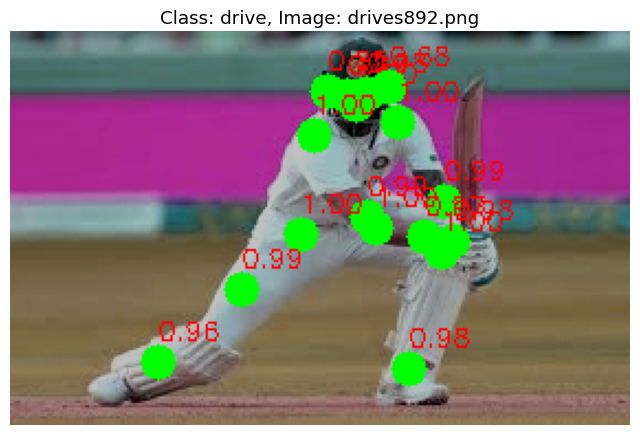

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/drive/drives746.png


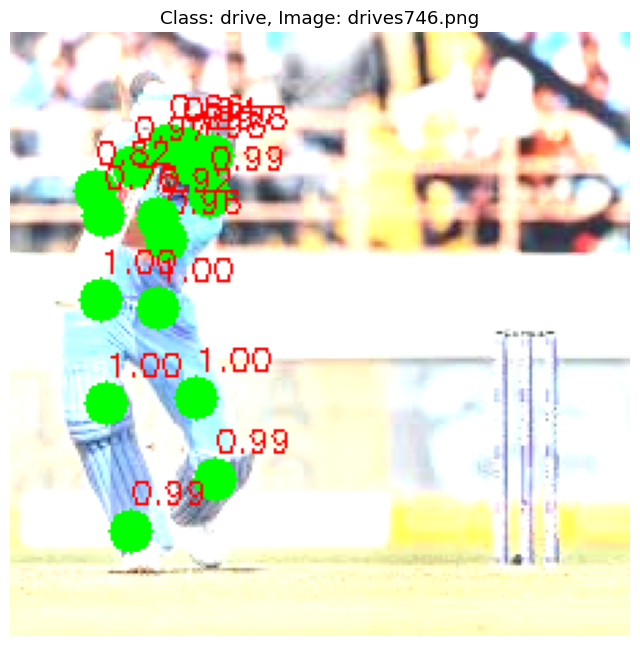

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/drive/drives1081.png


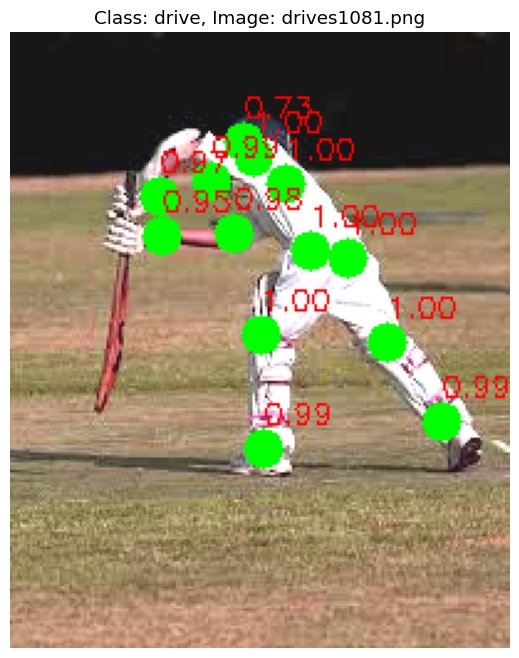

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/drive/drives415.png


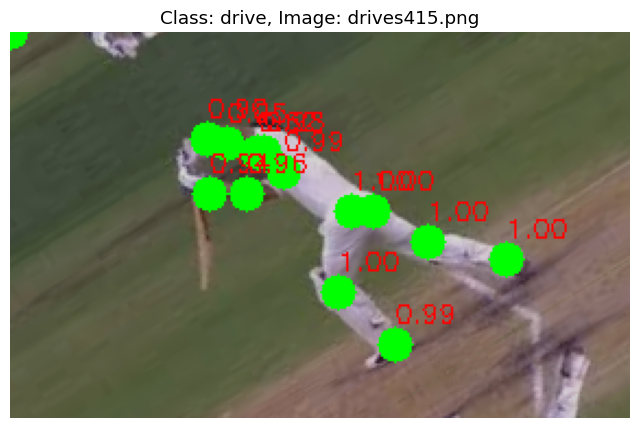

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/drive/drives1048.png


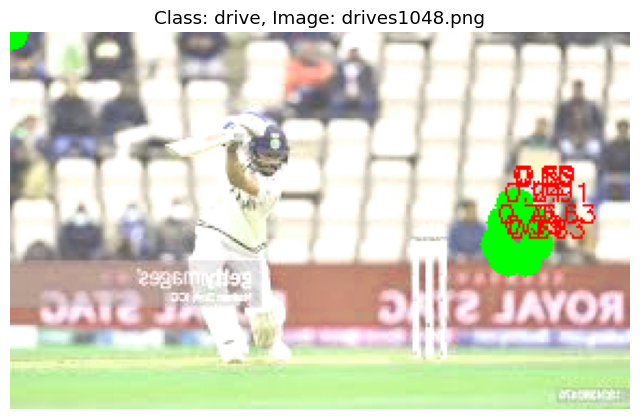

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/legglance-flick/legglance163.png


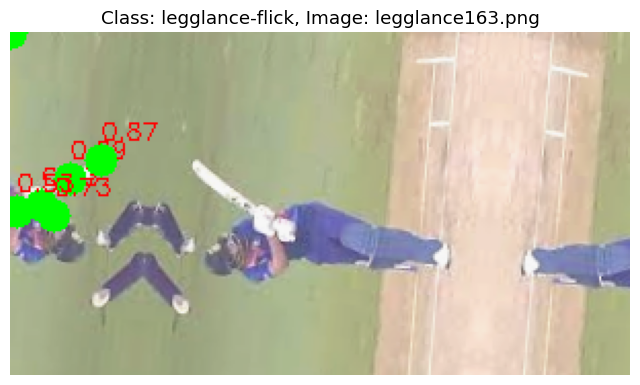

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/legglance-flick/legglance636.png


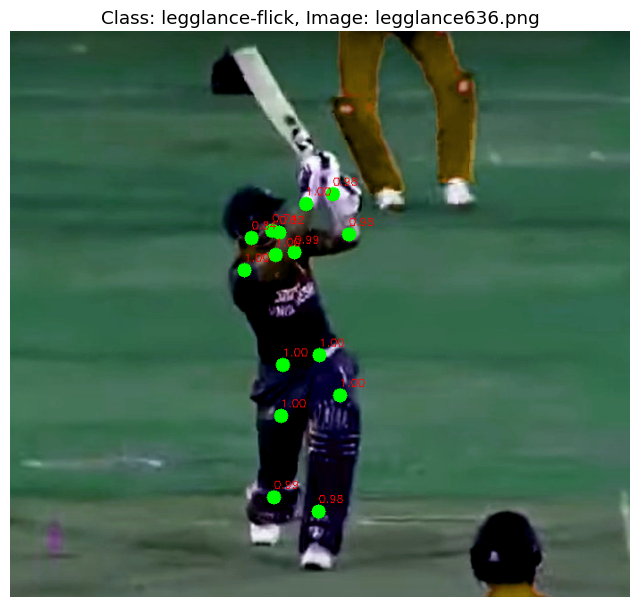

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/legglance-flick/legglance603.png


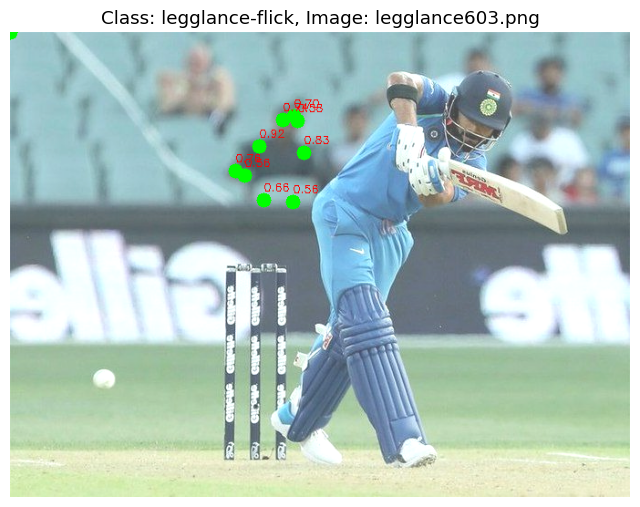

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/legglance-flick/legglance279.png


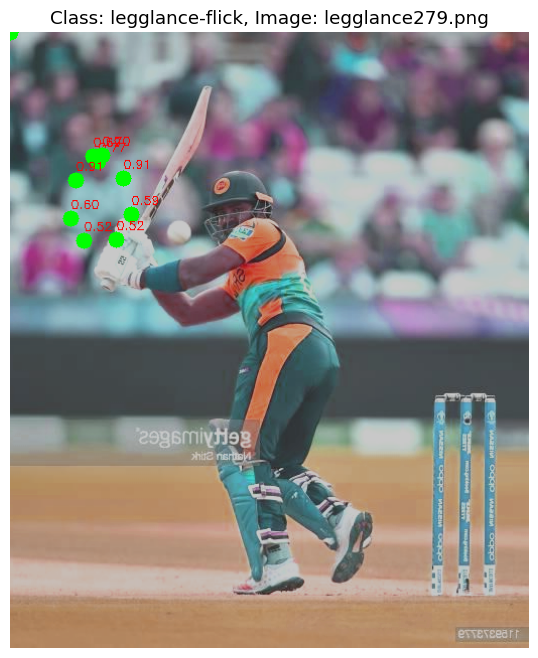

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/legglance-flick/legglance120.jpeg


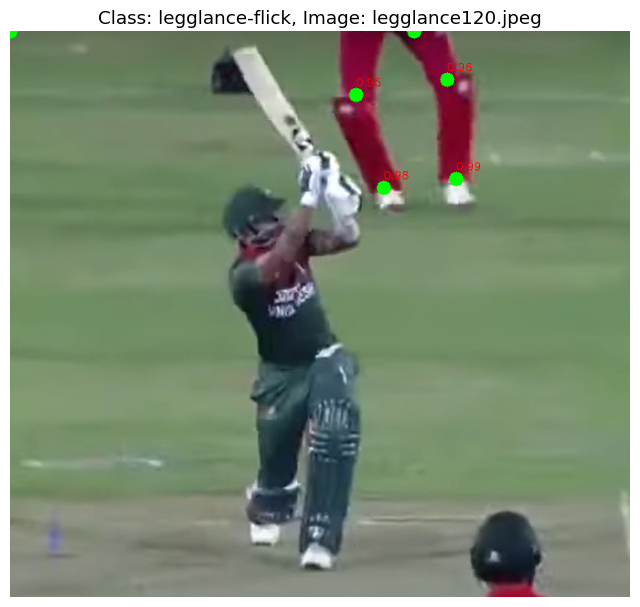

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/pullshot/pullshot40.png


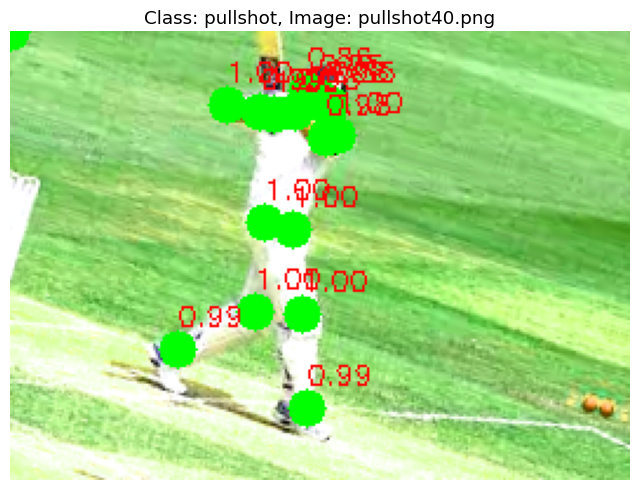

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/pullshot/pullshot1053.png


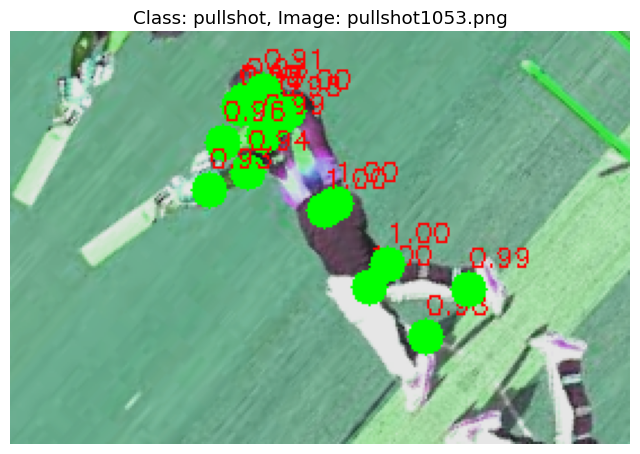

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/pullshot/pullshot1257.png


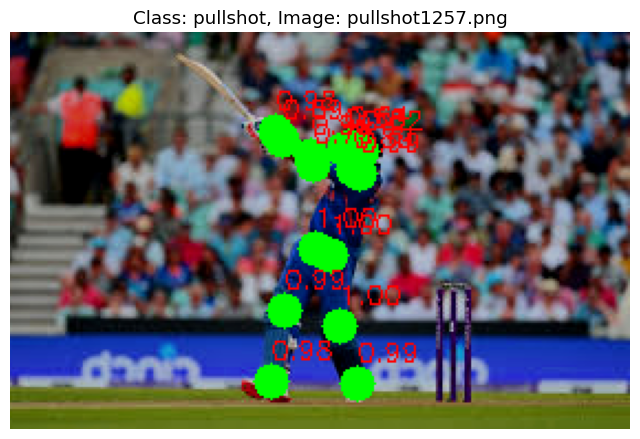

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/pullshot/pullshot1166.png


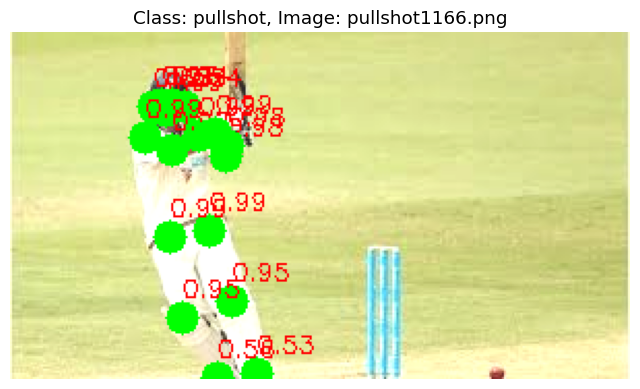

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/pullshot/pullshot394.png


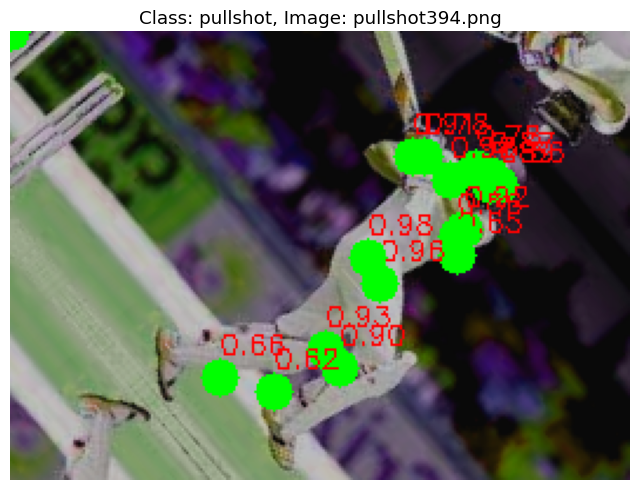

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/sweep/sweep238.png


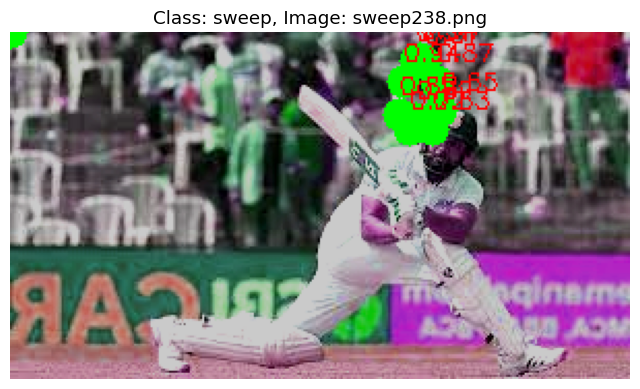

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/sweep/sweep643.png


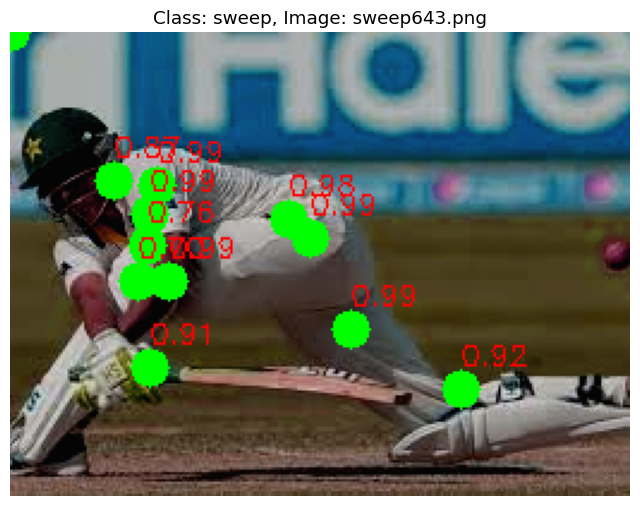

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/sweep/sweep1099.png


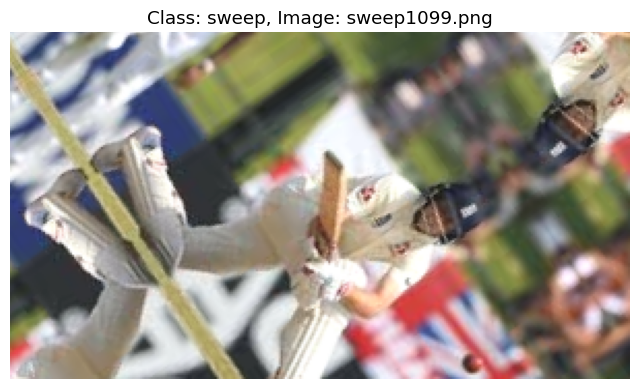

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/sweep/sweep124.png


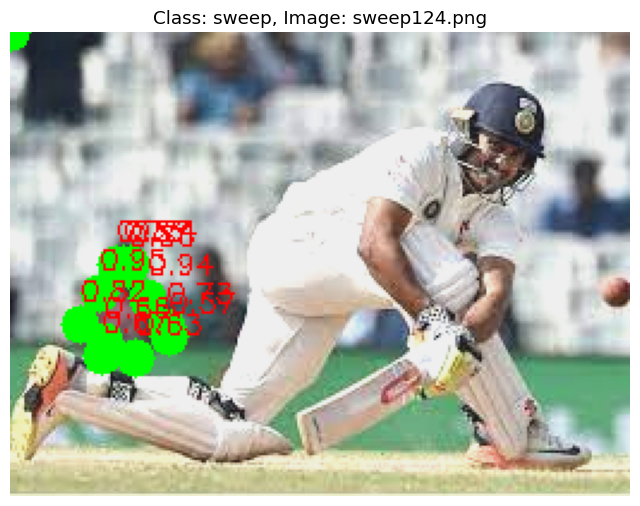

Processing: C:/Users/svani/OneDrive/Desktop/Cricket/train/sweep/sweep418.png


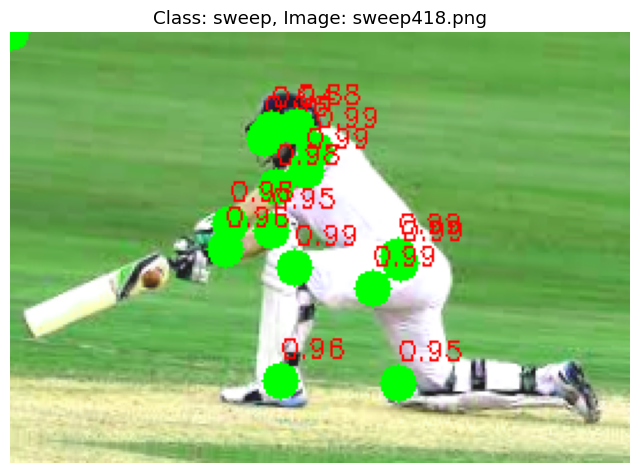

In [60]:
df = pd.read_csv('cricket_keypoints.csv')
image_folder = 'C:/Users/svani/OneDrive/Desktop/Cricket/train'

def plot_image_with_keypoints(image_name, class_name, keypoints_data):
    try:
        image_path = f"{image_folder}/{class_name}/{image_name}"
        print(f"Processing: {image_path}")
        img = cv2.imread(image_path)

        if img is None:
            print(f"Error: Image not found at {image_path}")
            return
        
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Extract Keypoints Safely
        try:
            keypoints = ast.literal_eval(keypoints_data)
        except Exception as e:
            print(f"Error evaluating keypoints for {image_name}: {e}")
            return
        
        if isinstance(keypoints, list) and len(keypoints) > 0 and isinstance(keypoints[0], list):
            keypoints = keypoints[0]

        # Plot Keypoints
        for keypoint in keypoints:
            if len(keypoint) == 3:
                x, y, conf = keypoint
                if conf > 0.2:  # Confidence Threshold
                    cv2.circle(img_rgb, (int(x), int(y)), 8, (0, 255, 0), -1)  
                    cv2.putText(img_rgb, f'{conf:.2f}', (int(x), int(y)-10), 
                                cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 0, 0), 1)
            else:
                print(f"Invalid keypoint format in {image_name}: {keypoint}")

        # Display Image with Keypoints
        plt.figure(figsize=(8, 8))
        plt.imshow(img_rgb)
        plt.title(f"Class: {class_name}, Image: {image_name}")
        plt.axis('off')
        plt.show()

    except Exception as e:
        print(f"Unexpected error for {image_name}: {e}")

# Plotting 5 Random Images per Class
classes = df['Class'].unique()
for class_name in classes:
    class_images = df[df['Class'] == class_name]
    if len(class_images) < 5:
        print(f"Not enough images for class: {class_name}")
        continue
    
    sample_images = class_images.sample(min(5, len(class_images)))
    for _, row in sample_images.iterrows():
        plot_image_with_keypoints(row['Image'], row['Class'], row['Keypoints'])


In [92]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [93]:
data = pd.read_csv('cricket_keypoints.csv')

In [94]:
data

,Image,Class,Keypoints
0,drives1.png,drive,"[[[171.25445556640625, 1.2669715881347656, 0.7..."
1,drives1.png,drive,"[[[63.043724060058594, 51.41681671142578, 0.84..."
2,drives10.png,drive,"[[[108.24054718017578, 59.3515510559082, 0.966..."
3,drives100.png,drive,"[[[0.0, 0.0, 0.15085339546203613], [0.0, 0.0, ..."
4,drives1000.png,drive,"[[[132.80482482910156, 55.412986755371094, 0.9..."
...,...,...,...
6534,sweep995.png,sweep,"[[[205.1236572265625, 54.480674743652344, 0.77..."
6535,sweep996.png,sweep,"[[[183.43470764160156, 31.293487548828125, 0.5..."
6536,sweep997.png,sweep,"[[[0.0, 0.0, 0.4698925316333771], [0.0, 0.0, 0..."
6537,sweep998.png,sweep,"[[[97.8957290649414, 45.71175765991211, 0.9807..."


In [95]:
def preprocess_keypoints(keypoints):
    try:
        keypoints = np.array(eval(keypoints))
        # Pad or truncate to ensure 100 keypoints with 3 values each
        if keypoints.shape[0] < 100:
            padding = np.zeros((100 - keypoints.shape[0], 3))
            keypoints = np.vstack((keypoints, padding))
        elif keypoints.shape[0] > 100:
            keypoints = keypoints[:100]
        return keypoints
    except Exception as e:
        return np.zeros((100, 3))

In [96]:
X = np.array([preprocess_keypoints(kp) for kp in data['Keypoints']])
y = data['Class']

In [97]:
X

array([[[          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0],
        ...,
        [          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0]],

       [[          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0],
        ...,
        [          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0]],

       [[          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0],
        ...,
        [          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0]],

       ...,

       [[          0,           0,           0],
        [  

In [98]:
y

0       drive
1       drive
2       drive
3       drive
4       drive
        ...  
6534    sweep
6535    sweep
6536    sweep
6537    sweep
6538    sweep
Name: Class, Length: 6539, dtype: object

In [99]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

In [100]:
label_encoder

LabelEncoder()

In [101]:
y_encoded

array([0, 0, 0, ..., 3, 3, 3])

In [102]:
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

In [103]:
X_train

array([[[          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0],
        ...,
        [          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0]],

       [[          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0],
        ...,
        [          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0]],

       [[          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0],
        ...,
        [          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0]],

       ...,

       [[          0,           0,           0],
        [  

In [104]:
X_test

array([[[          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0],
        ...,
        [          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0]],

       [[          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0],
        ...,
        [          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0]],

       [[          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0],
        ...,
        [          0,           0,           0],
        [          0,           0,           0],
        [          0,           0,           0]],

       ...,

       [[          0,           0,           0],
        [  

In [105]:
# CNN-LSTM Model
model = keras.Sequential([
    layers.Conv1D(64, kernel_size=3, activation='relu', input_shape=(100, 3)),
    layers.MaxPooling1D(pool_size=2),
    layers.Conv1D(128, kernel_size=3, activation='relu'),
    layers.MaxPooling1D(pool_size=2),
    layers.LSTM(64, return_sequences=False),
    layers.Dense(64, activation='relu'),
    layers.Dense(len(np.unique(y_encoded)), activation='softmax')
])

C:\Users\svani\anaconda3\envs\tensorflow\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [107]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)                    │ (None, 98, 64)              │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_2 (MaxPooling1D)       │ (None, 49, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_3 (Conv1D)                    │ (None, 47, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_3 (MaxPooling1D)       │ (None, 23, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 4)                   │             260 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 79,172 (309.27 KB)

 Trainable params: 79,172 (309.27 KB)

 Non-trainable params: 0 (0.00 B)

In [108]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [116]:
history = model.fit(x_train, y_train, epochs=50, batch_size=64, validation_split=0.2, callbacks=callbacks)
test_loss, test_acc = model.evaluate(x_test, y_test)
print(f"Test Accuracy: {test_acc}")


Epoch 1/50
750/750 ━━━━━━━━━━━━━━━━━━━━ 15s 17ms/step - accuracy: 0.4626 - loss: 1.5595 - val_accuracy: 0.9252 - val_loss: 0.2507 - learning_rate: 1.0000e-04
Epoch 2/50
750/750 ━━━━━━━━━━━━━━━━━━━━ 13s 17ms/step - accuracy: 0.9147 - loss: 0.2828 - val_accuracy: 0.9577 - val_loss: 0.1427 - learning_rate: 1.0000e-04
Epoch 3/50
750/750 ━━━━━━━━━━━━━━━━━━━━ 13s 17ms/step - accuracy: 0.9426 - loss: 0.1893 - val_accuracy: 0.9597 - val_loss: 0.1312 - learning_rate: 1.0000e-04
Epoch 4/50
750/750 ━━━━━━━━━━━━━━━━━━━━ 12s 16ms/step - accuracy: 0.9565 - loss: 0.1461 - val_accuracy: 0.9684 - val_loss: 0.1002 - learning_rate: 1.0000e-04
Epoch 5/50
750/750 ━━━━━━━━━━━━━━━━━━━━ 13s 17ms/step - accuracy: 0.9639 - loss: 0.1203 - val_accuracy: 0.9732 - val_loss: 0.0831 - learning_rate: 1.0000e-04
Epoch 6/50
750/750 ━━━━━━━━━━━━━━━━━━━━ 12s 17ms/step - accuracy: 0.9700 - loss: 0.0975 - val_accuracy: 0.9728 - val_loss: 0.0839 - learning_rate: 1.0000e-04
Epoch 7/50
750/750 ━━━━━━━━━━━━━━━━━━━━ 12s 16ms/ste

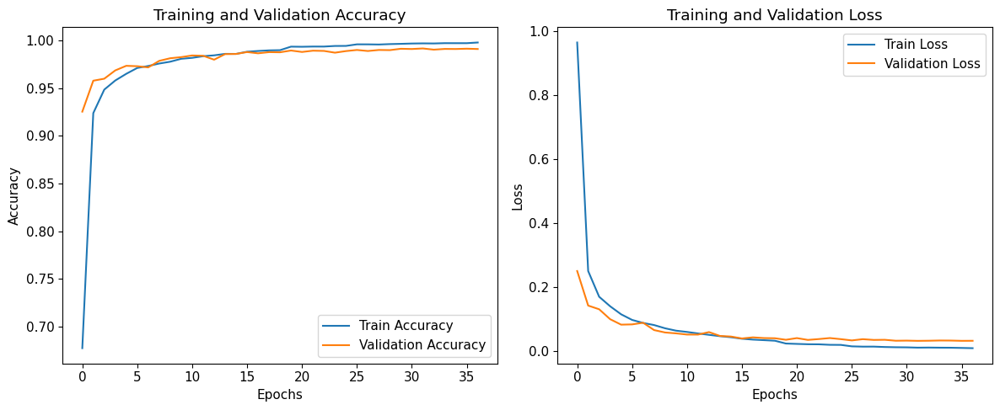

In [117]:
# Plot training & validation accuracy and loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.tight_layout()
plt.show()


313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


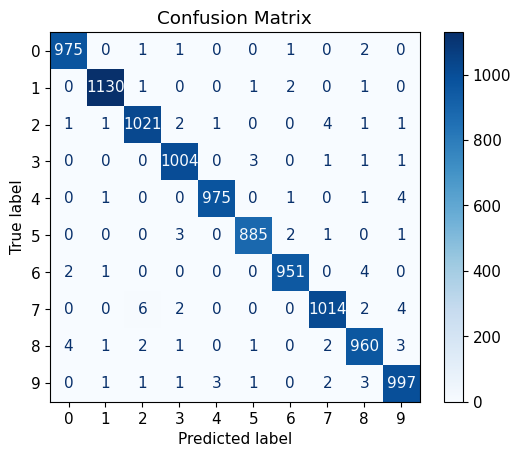

In [118]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

y_pred = np.argmax(model.predict(x_test), axis=1)

cm = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(10))
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()


In [119]:
import torch
import torch.nn as nn

# Assuming your Sequential model
model = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=2, stride=2),
    nn.Flatten(),
    nn.Linear(16 * 50 * 50, 10)  # Adjust dimensions as needed
)

class PoseModel(nn.Module):
    def __init__(self, model):
        super(PoseModel, self).__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

pose_model = PoseModel(model)
torch.save(pose_model.state_dict(), 'yolov7-w6-pose.pt')
print("Model saved as yolov7-w6-pose.pt")


Model saved as yolov7-w6-pose.pt


In [120]:
# TESTING

In [121]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import urllib.request
import sys
import torch
import time
import datetime

from torchvision import transforms
from PIL import Image

import moviepy
print(moviepy.__file__)

%matplotlib inline

C:\Users\svani\anaconda3\envs\tensorflow\lib\site-packages\moviepy\__init__.py


In [122]:
sys.version

'3.10.13 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:15:57) [MSC v.1916 64 bit (AMD64)]'

In [123]:
from utils.datasets import letterbox
from utils.general import non_max_suppression_kpt
from utils.plots import output_to_keypoint, plot_skeleton_kpts

In [124]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [125]:
device

device(type='cpu')

In [126]:
def image_view(imagefile, w=15, h=10):
    """
    Displaying an image from an image file
    """
    %matplotlib inline
    plt.figure(figsize=(w, h))
    plt.axis('off')
    plt.imshow(cv2.cvtColor(cv2.imread(imagefile), 
                            cv2.COLOR_BGR2RGB))

In [127]:
def loading_yolov7_model(yolomodel):
    """
    Loading yolov7 model
    """
    print("Loading model:", yolomodel)
    model = torch.load(yolomodel, map_location=device)['model']
    model.float().eval()

    if torch.cuda.is_available():
        # half() turns predictions into float16 tensors
        # which significantly lowers inference time
        model.half().to(device)

    return model, yolomodel

In [128]:
def running_inference(image):
    """
    Running yolov7 model inference
    """
    image = letterbox(image, 960, 
                      stride=64,
                      auto=True)[0]  # shape: (567, 960, 3)
    image = transforms.ToTensor()(image)  # torch.Size([3, 567, 960])

    if torch.cuda.is_available():
        image = image.half().to(device)

    image = image.unsqueeze(0)  # torch.Size([1, 3, 567, 960])

    with torch.no_grad():
        output, _ = model(image)

    return output, image

In [129]:
def draw_keypoints(output, image, confidence=0.25, threshold=0.65):
    """
    Draw YoloV7 pose keypoints
    """
    output = non_max_suppression_kpt(
        output,
        confidence,  # Confidence Threshold
        threshold,  # IoU Threshold
        nc=model.yaml['nc'],  # Number of Classes
        nkpt=model.yaml['nkpt'],  # Number of Keypoints
        kpt_label=True)

    with torch.no_grad():
        output = output_to_keypoint(output)

    nimg = image[0].permute(1, 2, 0) * 255
    nimg = cv2.cvtColor(nimg.cpu().numpy().astype(np.uint8), cv2.COLOR_RGB2BGR)

    for idx in range(output.shape[0]):
        plot_skeleton_kpts(nimg, output[idx, 7:].T, 3)

    return nimg

In [130]:
import os

print(os.path.exists(r"C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives13.png"))
k = r"C:\Users\svani\OneDrive\Desktop\Cricket\train\drive\drives13.png"

True


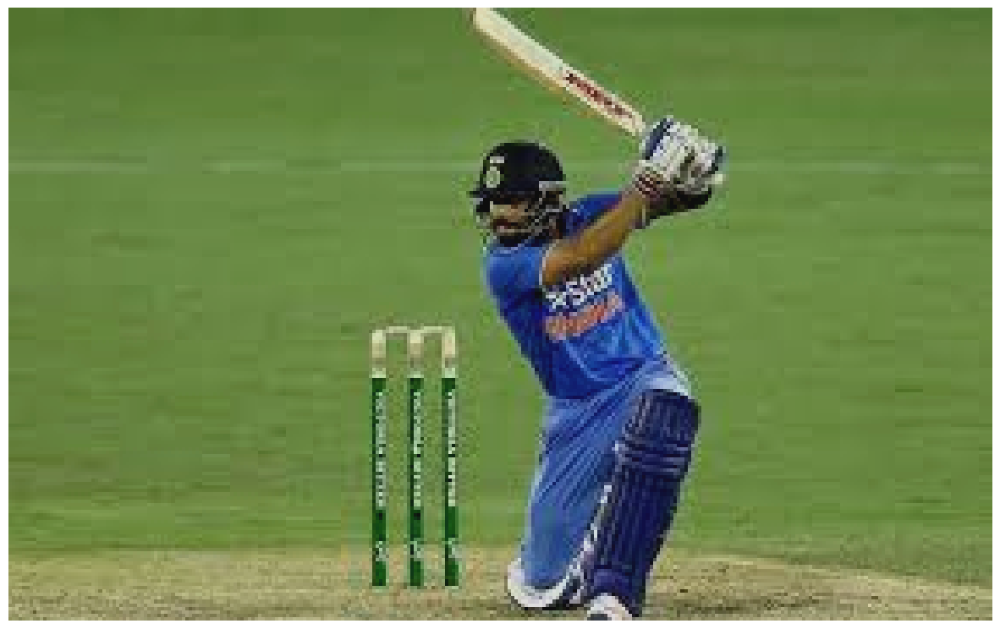

In [131]:
image_view(k)

In [132]:
YOLOV7_MODEL = "yolov7-w6-pose.pt"
YOLOV7MODEL = os.path.basename(YOLOV7_MODEL)

try:
    print("Loading the model...")
    model, yolomodel = loading_yolov7_model(yolomodel=YOLOV7MODEL)
    print("Using the", YOLOV7MODEL, "model")
    print("Done")

except:
    print("[Error] Cannot load the model", YOLOV7MODEL)

Loading the model...
Loading model: yolov7-w6-pose.pt
Using the yolov7-w6-pose.pt model
Done


In [133]:
print(model)

Model(
  (model): Sequential(
    (0): ReOrg()
    (1): Conv(
      (conv): Conv2d(12, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU()
    )
    (2): Conv(
      (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU()
    )
    (3): Conv(
      (conv): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU()
    )
    (4): Conv(
      (conv): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU()
    )
    (5): Conv(
      (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1)

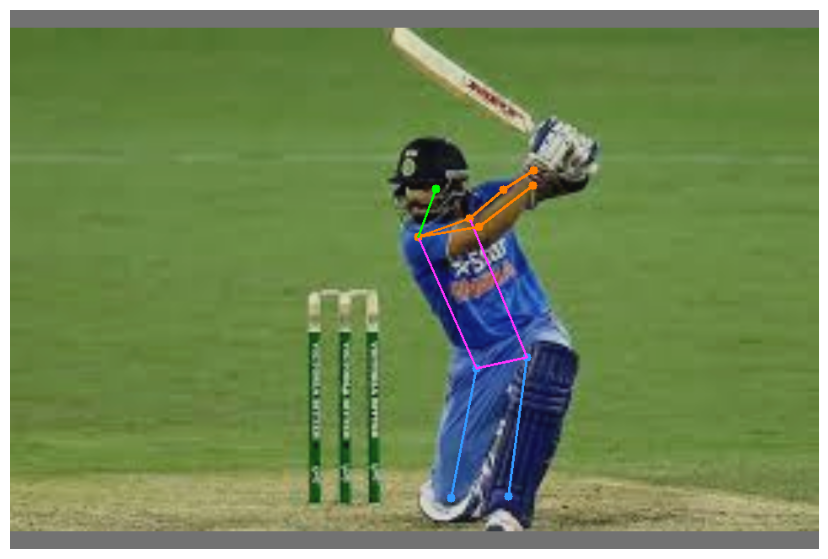

In [134]:
imagefile = k

output, image = running_inference(cv2.imread(imagefile))
pose_image = draw_keypoints(output, image, confidence=0.25, threshold=0.65)

plt.figure(figsize=(30, 7))
plt.axis("off")
plt.imshow(pose_image)

In [ ]:
# END